# ASHRAE - Great Energy Predictor III
## How much energy will a building consume?

### Read in Data

In [1]:
%run '../../../utils.ipynb'

done


In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import gc
warnings.simplefilter('ignore')
matplotlib.rcParams['figure.dpi'] = 100
sns.set()
%matplotlib inline

import os

In [3]:
input_path = '../../input/'

train = pd.read_csv(os.path.join(input_path, 'train.csv'))
test = pd.read_csv(os.path.join(input_path, 'test.csv'))
weather_train = pd.read_csv(os.path.join(input_path, 'weather_train.csv'))
weather_test = pd.read_csv(os.path.join(input_path, 'weather_test.csv'))
building = pd.read_csv(os.path.join(input_path, 'building_metadata.csv'))

In [4]:
train = reduce_mem_usage(train)
test = reduce_mem_usage(test)
weather_train = reduce_mem_usage(weather_train)
weather_test = reduce_mem_usage(weather_test)
building = reduce_mem_usage(building)

Mem. usage decreased to 289.19 Mb (53.1% reduction)
Mem. usage decreased to 596.49 Mb (53.1% reduction)
Mem. usage decreased to  3.07 Mb (68.1% reduction)
Mem. usage decreased to  6.08 Mb (68.1% reduction)
Mem. usage decreased to  0.03 Mb (60.3% reduction)


In [5]:
train = train.merge(building, on='building_id', how='left')
test = test.merge(building, on='building_id', how='left')

train = train.merge(weather_train, on=['site_id', 'timestamp'], how='left')
test = test.merge(weather_test, on=['site_id', 'timestamp'], how='left')
del weather_train, weather_test,building
gc.collect();

In [6]:
train["date"] = pd.to_datetime(train["timestamp"])
test["date"] = pd.to_datetime(test["timestamp"])
gc.collect();

In [7]:
meter_dic = {0: 'electricity', 1: 'chilledwater', 2: 'steam', 3: 'hotwater'}

In [8]:
train.head()

,building_id,meter,timestamp,meter_reading,site_id,primary_use,square_feet,year_built,floor_count,air_temperature,cloud_coverage,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed,date
0,0,0,2016-01-01 00:00:00,0.0,0,Education,7432,2008.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0,2016-01-01
1,1,0,2016-01-01 00:00:00,0.0,0,Education,2720,2004.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0,2016-01-01
2,2,0,2016-01-01 00:00:00,0.0,0,Education,5376,1991.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0,2016-01-01
3,3,0,2016-01-01 00:00:00,0.0,0,Education,23685,2002.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0,2016-01-01
4,4,0,2016-01-01 00:00:00,0.0,0,Education,116607,1975.0,NaN,25.0,6.0,20.0,NaN,1019.5,0.0,0.0,2016-01-01


### Amount of available data and NaNs

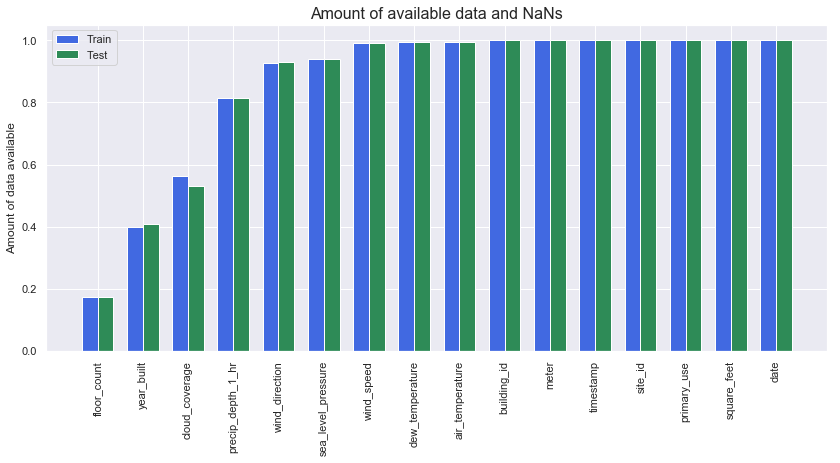

In [24]:
train_data = (train.count() / len(train)).drop('meter_reading').sort_values().values
ind = np.arange(len(train_data))
width = 0.35


fig, axes = plt.subplots(1,1,figsize=(14, 6))
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = (test.count() / len(test)).drop('row_id').sort_values().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Amount of data available');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels((train.count() / len(train)).drop('meter_reading').sort_values().index, rotation=90)
axes.set_title('Amount of available data and NaNs', fontsize=16)
axes.legend([tr, tt], ['Train', 'Test'])


### Mean meter reading by day

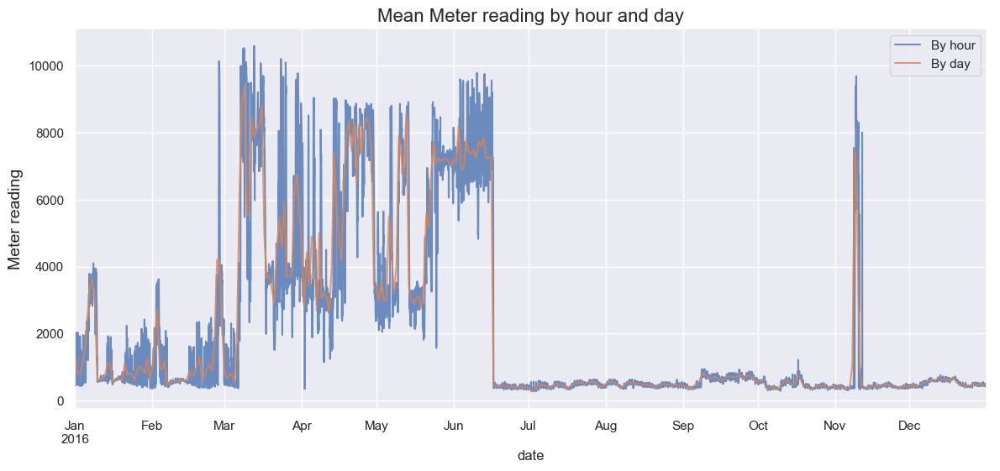

In [26]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6), dpi=100)
tmp_H = train[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes, label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes, label='By day', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
axes.set_title('Mean Meter reading by hour and day', fontsize=16);
axes.legend()

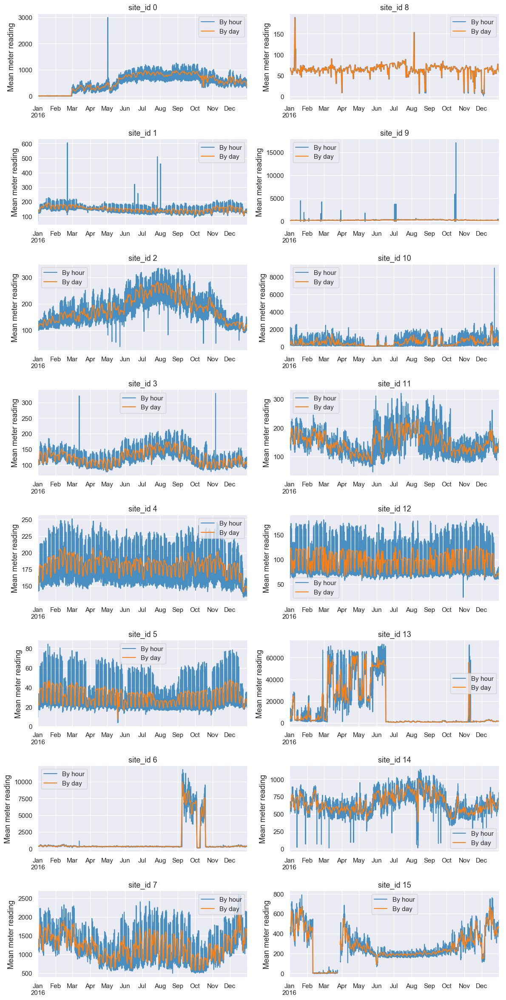

In [35]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    tmp_H= train[train['site_id'] == i][['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
    tmp_H.plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    tmp_D = train[train['site_id'] == i][['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
    tmp_D.plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange').set_xlabel('');
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);
    plt.subplots_adjust(hspace=0.45)

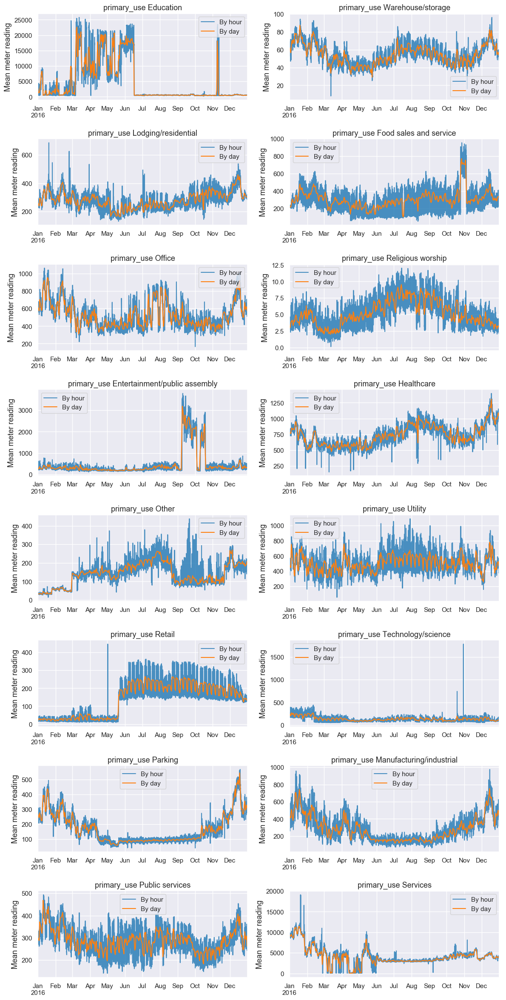

In [17]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i, use in enumerate(train['primary_use'].unique()):
    tmp_H= train[train['primary_use'] == use][['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
    tmp_H.plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    tmp_D = train[train['primary_use'] == use][['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
    tmp_D.plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange').set_xlabel('');
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('primary_use {}'.format(use), fontsize=13);
    plt.subplots_adjust(hspace=0.45)

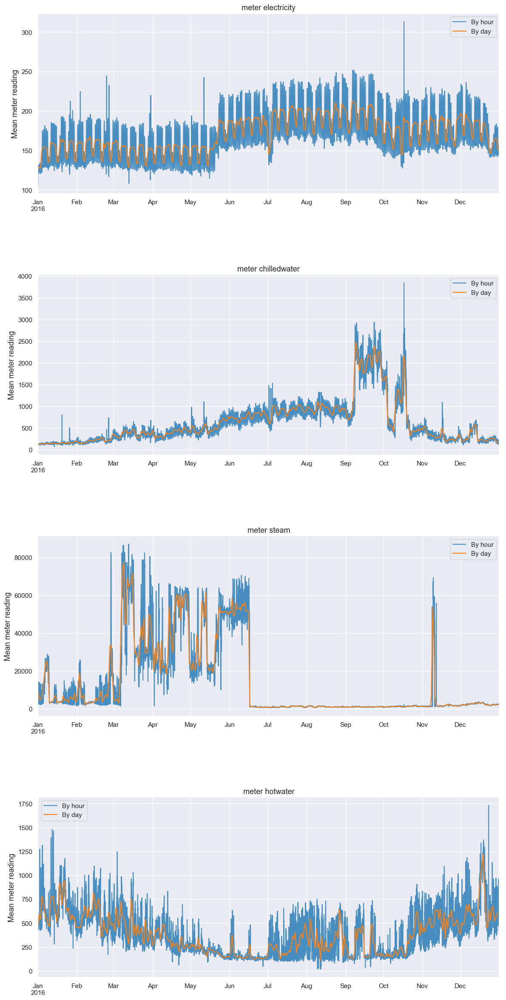

In [27]:
fig, axes = plt.subplots(4,1,figsize=(14, 30), dpi=100)
for i in range(train['meter'].nunique()):
    tmp_H= train[train['meter'] == i][['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
    tmp_H.plot(ax=axes[i], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    tmp_D = train[train['meter'] == i][['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
    tmp_D.plot(ax=axes[i], alpha=1, label='By day', color='tab:orange').set_xlabel('');
    axes[i].legend();
    axes[i].set_title('meter {}'.format(meter_dic[i]), fontsize=13);
    plt.subplots_adjust(hspace=0.45)

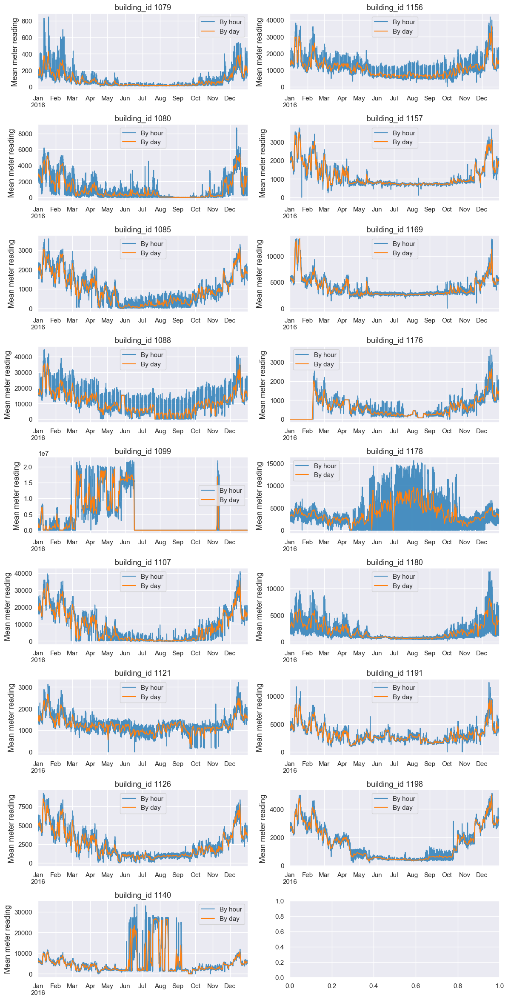

In [34]:
tmp = train[train.site_id==13][train.meter==2][train.primary_use=='Education']

fig, axes = plt.subplots(9,2,figsize=(14, 30), dpi=100)
for i, building in enumerate(tmp['building_id'].unique()):
    tmp_H= tmp[tmp['building_id'] == building][['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
    tmp_H.plot(ax=axes[i%9][i//9], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean meter reading', fontsize=13);
    tmp_D = tmp[tmp['building_id'] == building][['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
    tmp_D.plot(ax=axes[i%9][i//9], alpha=1, label='By day', color='tab:orange').set_xlabel('');
    axes[i%9][i//9].legend();
    axes[i%9][i//9].set_title('building_id {}'.format(building), fontsize=13);
    plt.subplots_adjust(hspace=0.45)

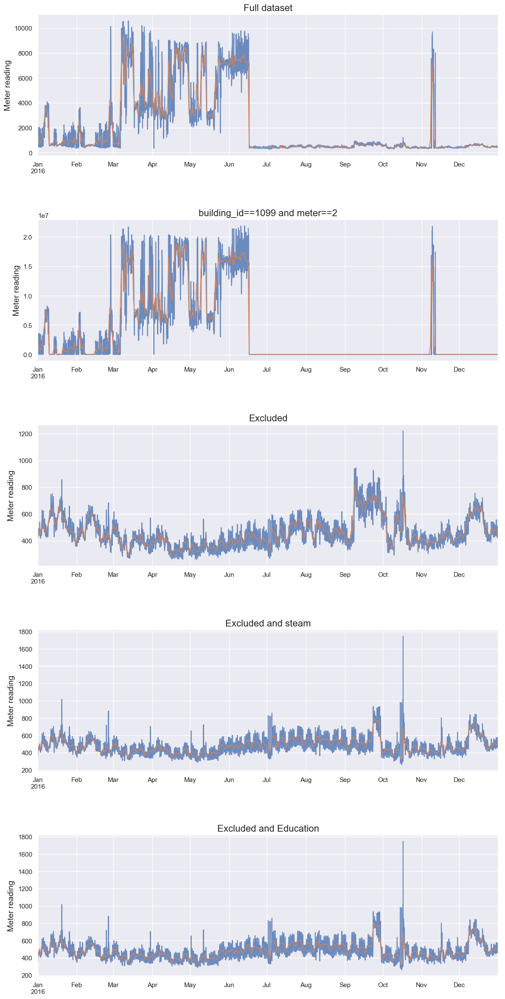

In [9]:
fig, axes = plt.subplots(5, 1, figsize=(14, 30), dpi=100)
train_1099 = train[train.building_id==1099][train.meter==2]
train_anti1099 = train[~((train.building_id==1099) & (train.meter==2))]
train_anti1099_steam = train_anti1099[train_anti1099.meter==2]
train_anti1099_steam = train_anti1099[train_anti1099.primary_use=='Education']

tmp_H = train[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes[0], label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes[0], label='By day', alpha=0.8).set_xlabel('')
axes[0].set_title('Full dataset', fontsize=16)

tmp_H = train_1099[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes[1], label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train_1099[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes[1], label='By day', alpha=0.8).set_xlabel('')
axes[1].set_title('building_id==1099 and meter==2', fontsize=16)

tmp_H = train_anti1099[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes[2], label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train_anti1099[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes[2], label='By day', alpha=0.8).set_xlabel('')
axes[2].set_title('Excluded', fontsize=16)

tmp_H = train_anti1099_steam[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes[3], label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train_anti1099_steam[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes[3], label='By day', alpha=0.8).set_xlabel('')
axes[3].set_title('Excluded and steam', fontsize=16)

tmp_H = train_anti1099_steam[['date', 'meter_reading']].set_index('date').resample('H').mean()['meter_reading']
tmp_H.plot(ax=axes[4], label='By hour', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
tmp_D = train_anti1099_steam[['date', 'meter_reading']].set_index('date').resample('D').mean()['meter_reading']
tmp_D.plot(ax=axes[4], label='By day', alpha=0.8).set_xlabel('')
axes[4].set_title('Excluded and Education', fontsize=16)


plt.subplots_adjust(hspace=0.45)

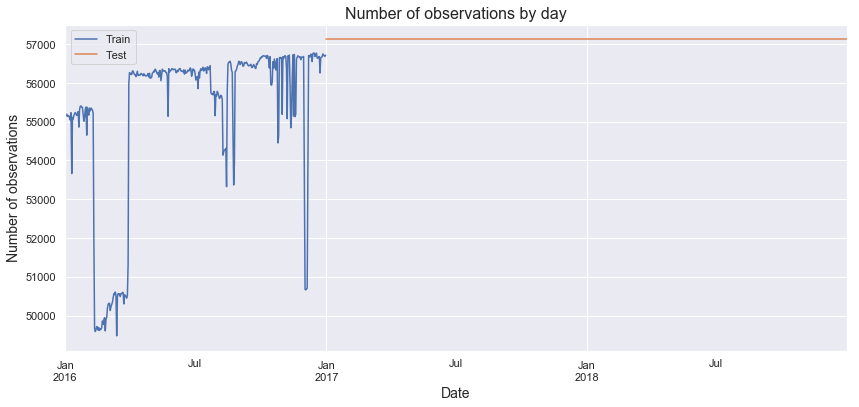

In [54]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6))
train['date'].dt.floor('d').value_counts().sort_index().plot(ax=axes).set_xlabel('Date', fontsize=14);
test['date'].dt.floor('d').value_counts().sort_index().plot(ax=axes).set_ylabel('Number of observations', fontsize=14);
axes.set_title('Number of observations by day', fontsize=16);
axes.legend(['Train', 'Test'])

## Number of observations by day

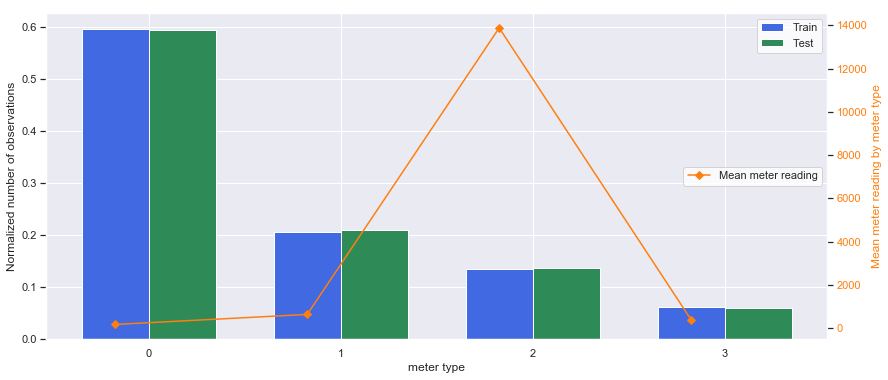

In [81]:
train_data = train['meter'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6))
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['meter'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('meter type');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels(train['meter'].value_counts().sort_index().index, rotation=0)

axes2 = axes.twinx()
tmp_mr = train[['meter', 'meter_reading']].groupby('meter')['meter_reading'].mean().sort_index().values
mr = axes2.plot(ind, tmp_mr, 'D-', color='tab:orange', label='Mean meter reading')
axes2.grid(False)

axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by meter type', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white')
axes2.legend(loc=5, facecolor='white')

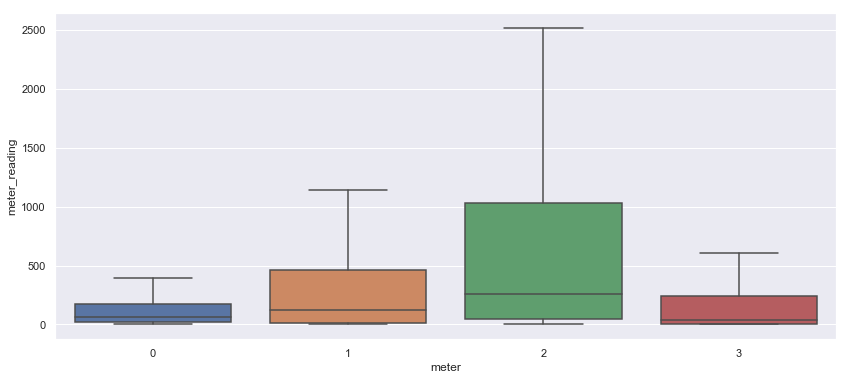

In [82]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6))
sns.boxplot(x='meter', y='meter_reading', data=train, showfliers=False)

518

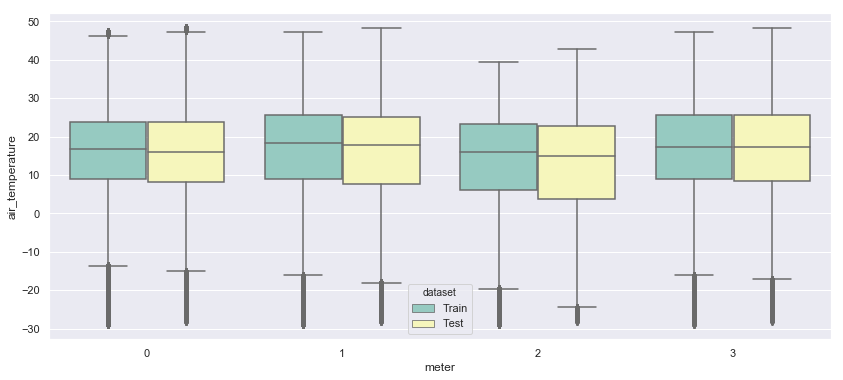

In [86]:
tmp_df = pd.concat([train[['meter', 'air_temperature']], test[['meter', 'air_temperature']]], ignore_index=True)
tmp_df['dataset'] = 'Train'
tmp_df.loc[tmp_df.index > len(train), 'dataset'] = 'Test'

fig, axes = plt.subplots(1, 1, figsize=(14, 6))
sns.boxplot(x='meter', y='air_temperature', data=tmp_df, hue='dataset', palette="Set3");

del tmp_df
gc.collect()

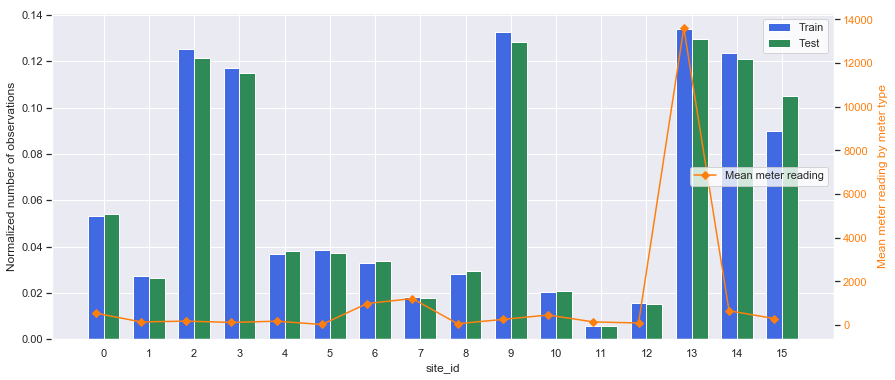

In [87]:
train_data = train['site_id'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6))
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['site_id'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('site_id');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels(train['site_id'].value_counts().sort_index().index, rotation=0)

axes2 = axes.twinx()
tmp_mr = train[['site_id', 'meter_reading']].groupby('site_id')['meter_reading'].mean().sort_index().values
mr = axes2.plot(ind, tmp_mr, 'D-', color='tab:orange', label='Mean meter reading')
axes2.grid(False)

axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by meter type', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white')
axes2.legend(loc=5, facecolor='white')

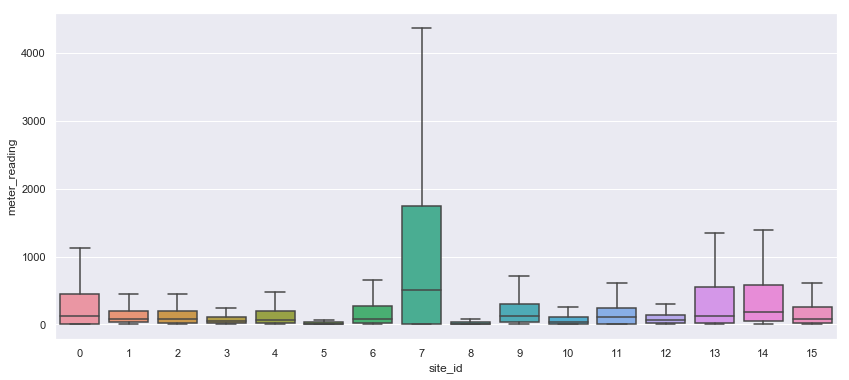

In [89]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6))
sns.boxplot(x='site_id', y='meter_reading', data=train, showfliers=False)

5528

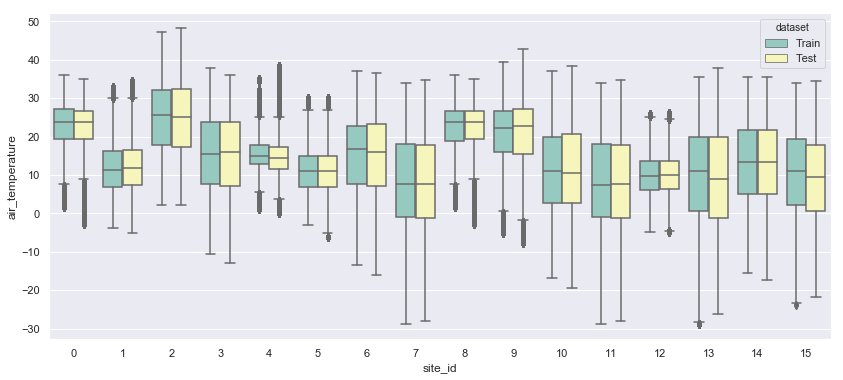

In [90]:
tmp_df = pd.concat([train[['site_id', 'air_temperature']], test[['site_id', 'air_temperature']]], ignore_index=True)
tmp_df['dataset'] = 'Train'
tmp_df.loc[tmp_df.index > len(train), 'dataset'] = 'Test'

fig, axes = plt.subplots(1, 1, figsize=(14, 6))
sns.boxplot(x='site_id', y='air_temperature', data=tmp_df, hue='dataset', palette="Set3");

del tmp_df
gc.collect()

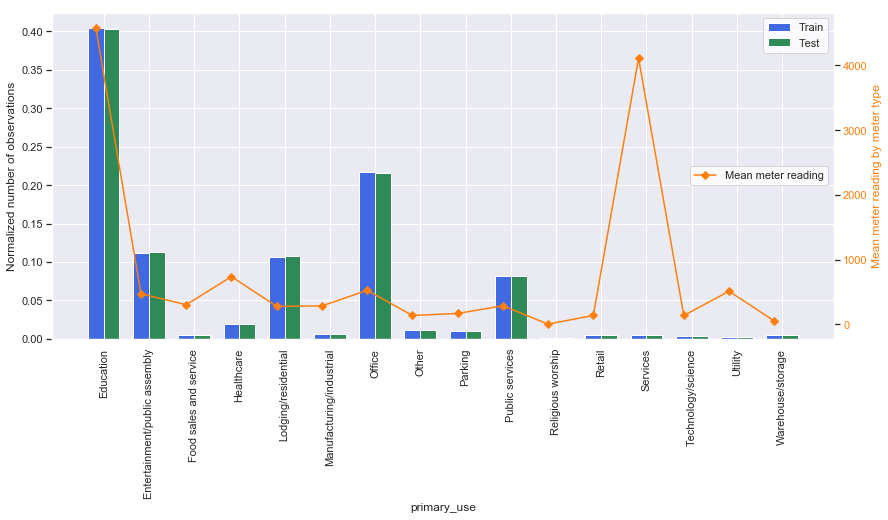

In [95]:
train_data = train['primary_use'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6))
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['primary_use'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('primary_use');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels(train['primary_use'].value_counts().sort_index().index, rotation=90)

axes2 = axes.twinx()
tmp_mr = train[['primary_use', 'meter_reading']].groupby('primary_use')['meter_reading'].mean().sort_index().values
mr = axes2.plot(ind, tmp_mr, 'D-', color='tab:orange', label='Mean meter reading')
axes2.grid(False)

axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by meter type', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white')
axes2.legend(loc=5, facecolor='white')

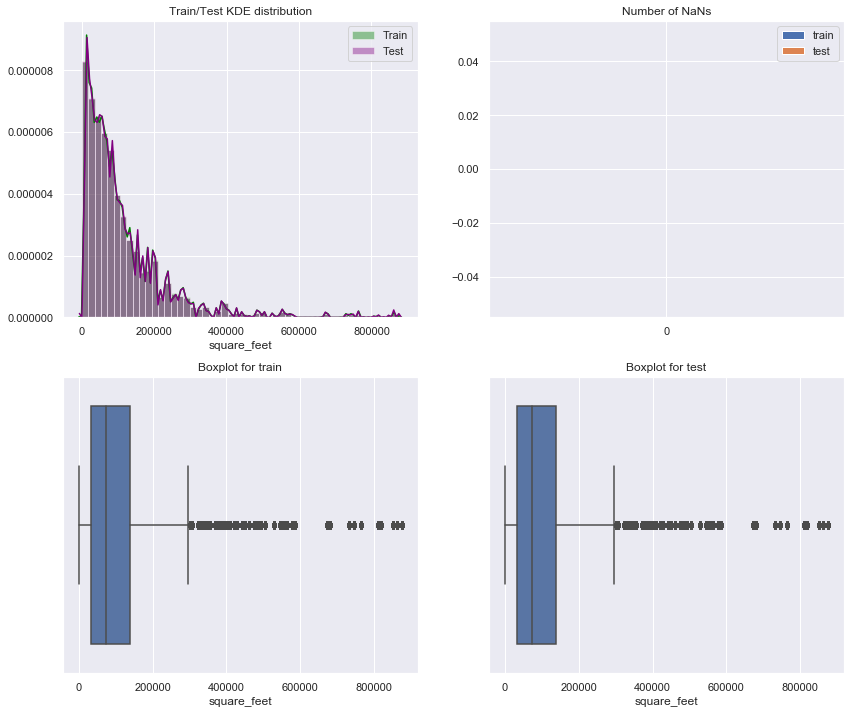

In [102]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
sns.distplot(train['square_feet'], ax=axes[0][0], label='Train', color='green')
sns.distplot(test['square_feet'], ax=axes[0][0], label='Test', color='purple')
sns.boxplot(x=train['square_feet'], ax=axes[1][0])
sns.boxplot(x=test['square_feet'], ax=axes[1][1])

tmp = pd.DataFrame({'train': [train['square_feet'].isnull().sum()], 'test': [test['square_feet'].isnull().sum()]})
tmp.plot(kind='bar', rot=0, ax=axes[0][1])
axes[0][0].legend()
axes[0][0].set_title('Train/Test KDE distribution')
axes[0][1].set_title('Number of NaNs')
axes[1][0].set_title('Boxplot for train')
axes[1][1].set_title('Boxplot for test')
del tmp

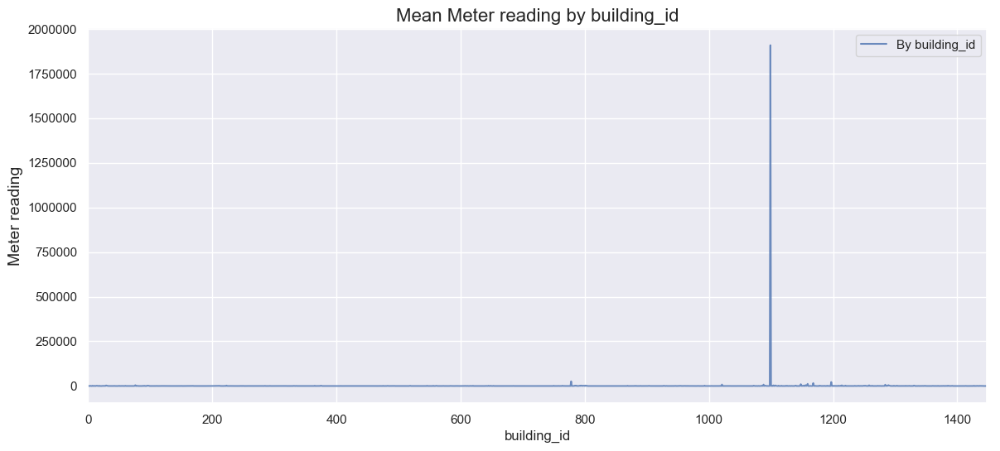

In [107]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6), dpi=100)
tmp = train[['building_id', 'meter_reading']].groupby('building_id').mean()['meter_reading']
tmp.plot(ax=axes, label='By building_id', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
axes.set_title('Mean Meter reading by building_id', fontsize=16);
axes.legend()

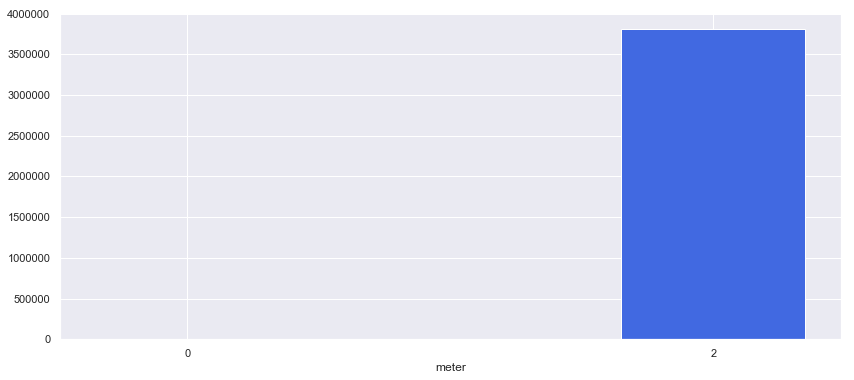

In [14]:
data_1099 = train[train.building_id==1099].groupby('meter').mean()
ind = np.arange(len(data_1099))
width = 0.35
fig, axes = plt.subplots(1,1,figsize=(14, 6))
tr = axes.bar(ind, data_1099['meter_reading'], width, color='royalblue')

axes.set_xlabel('meter');
axes.set_xticks(ind)
axes.set_xticklabels(data_1099.index)
plt.show()

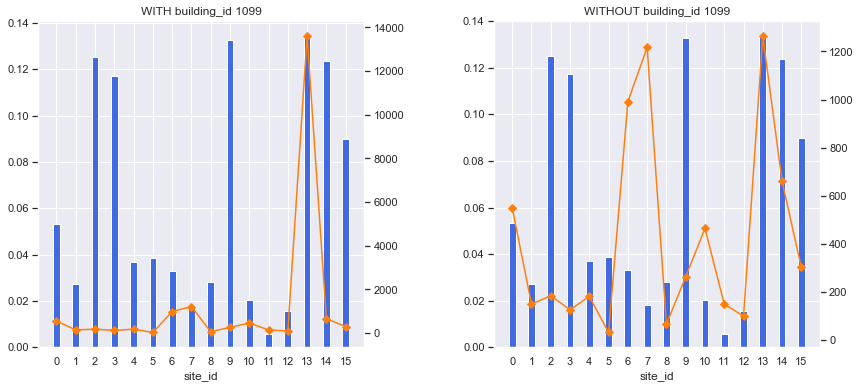

In [40]:
train_data = train['site_id'].value_counts(dropna=False, normalize=True).sort_index().values
train_data_anti1099 = train[train.building_id!=1099]['site_id'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,2,figsize=(14, 6))
tr = axes[0].bar(ind, train_data, width, color='royalblue')
tr_anto1099 = axes[1].bar(ind, train_data_anti1099, width, color='royalblue')

for i, data in enumerate([train, train[train.building_id!=1099]]):
    axes2 = axes[i].twinx()
    tmp_mr = data[['site_id', 'meter_reading']].groupby('site_id')['meter_reading'].mean().sort_index().values
    mr = axes2.plot(ind, tmp_mr, 'D-', color='tab:orange', label='Mean meter reading')
    axes2.grid(False)
    axes[i].set_xlabel('site_id');
    axes[i].set_xticks(ind)
    axes[i].set_xticklabels(train['site_id'].value_counts().sort_index().index)

plt.subplots_adjust(wspace=0.4)
axes[0].set_title('WITH building_id 1099')
axes[1].set_title('WITHOUT building_id 1099')
plt.show()

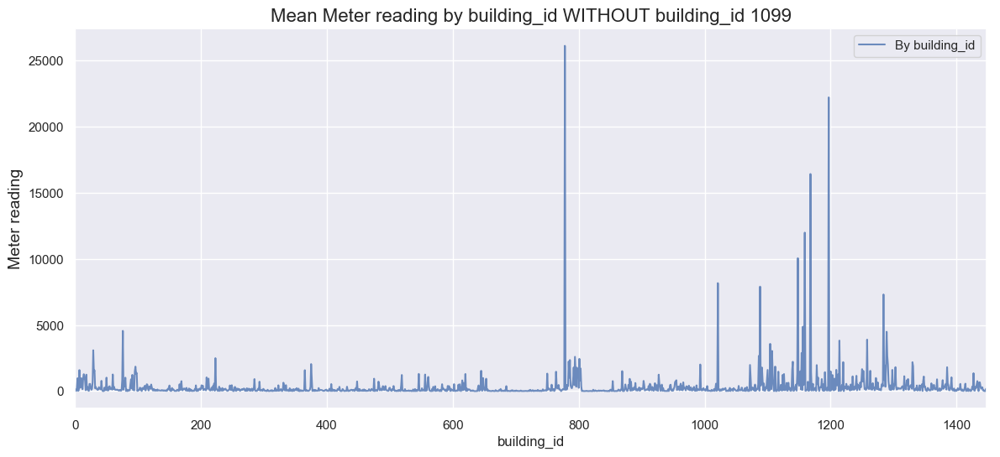

In [42]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6), dpi=100)
tmp = train[train.building_id!=1099][['building_id', 'meter_reading']].groupby('building_id').mean()['meter_reading']
tmp.plot(ax=axes, label='By building_id', alpha=0.8).set_ylabel('Meter reading', fontsize=14)
axes.set_title('Mean Meter reading by building_id WITHOUT building_id 1099', fontsize=16);
axes.legend()

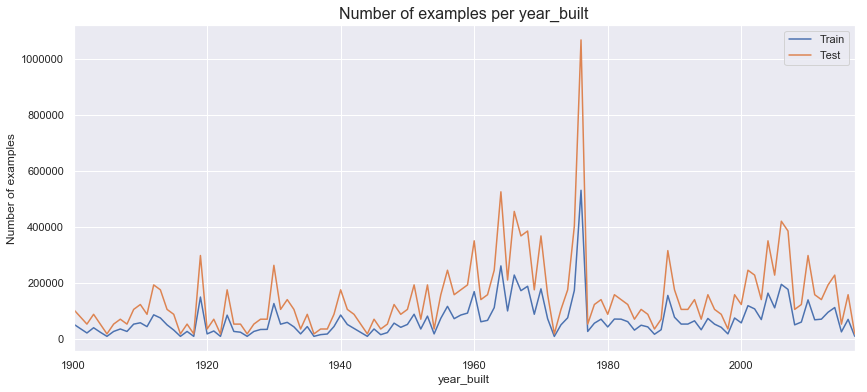

In [45]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
train['year_built'].value_counts(dropna=False).sort_index().plot(ax=axes).set_xlabel('year_built')
test['year_built'].value_counts(dropna=False).sort_index().plot(ax=axes).set_ylabel('Number of examples')
axes.legend(['Train', 'Test'])
axes.set_title('Number of examples per year_built', fontsize=16)
plt.show()

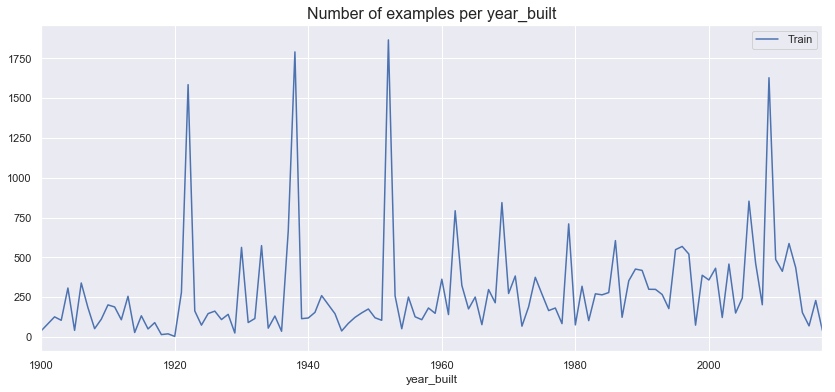

In [49]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
train[['year_built', 'meter_reading']].groupby('year_built').mean().sort_index().plot(ax=axes).set_xlabel('year_built')
axes.legend(['Train', 'Test'])
axes.set_title('Number of examples per year_built', fontsize=16)
plt.show()

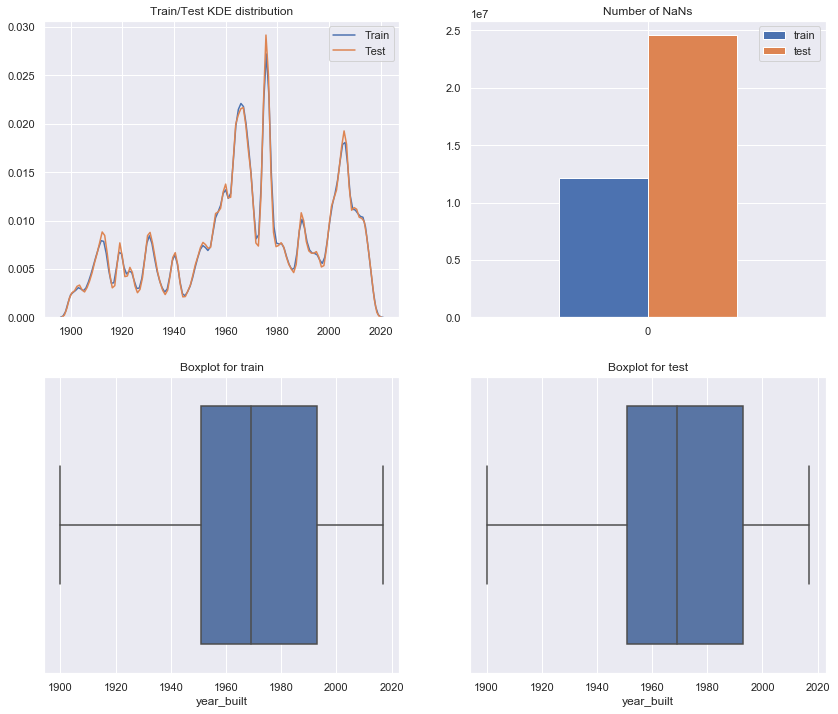

In [53]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
sns.kdeplot(train['year_built'], ax=axes[0][0], label='Train')
sns.kdeplot(test['year_built'], ax=axes[0][0], label='Test')
sns.boxplot(x=train['year_built'], ax=axes[1][0])
sns.boxplot(x=test['year_built'], ax=axes[1][1])

tmp = pd.DataFrame({'train': [train['year_built'].isnull().sum()], 'test': [test['year_built'].isnull().sum()]})
tmp.plot(kind='bar', rot=0, ax=axes[0][1])
axes[0][0].legend()
axes[0][0].set_title('Train/Test KDE distribution')
axes[0][1].set_title('Number of NaNs')
axes[1][0].set_title('Boxplot for train')
axes[1][1].set_title('Boxplot for test')
del tmp

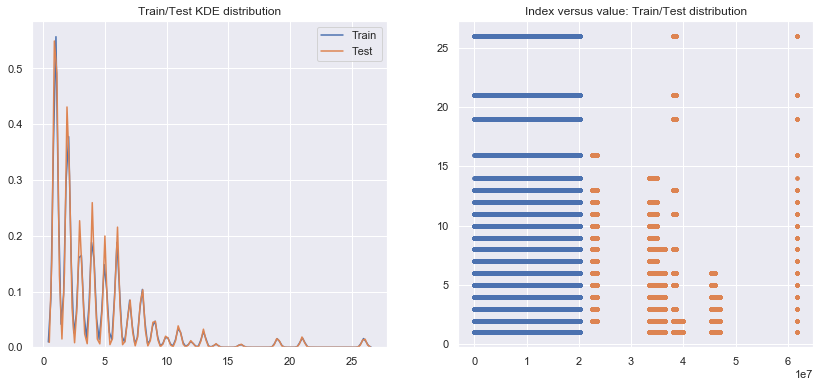

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.kdeplot(train['floor_count'], label='Train', ax=axes[0]);
sns.kdeplot(test['floor_count'], label='Test', ax=axes[0]);
test.index += len(train)
axes[1].plot(train['floor_count'], '.', label='Train');
axes[1].plot(test['floor_count'], '.', label='Test');
test.index -= len(train)
axes[0].set_title('Train/Test KDE distribution');
axes[1].set_title('Index versus value: Train/Test distribution');
gc.collect();

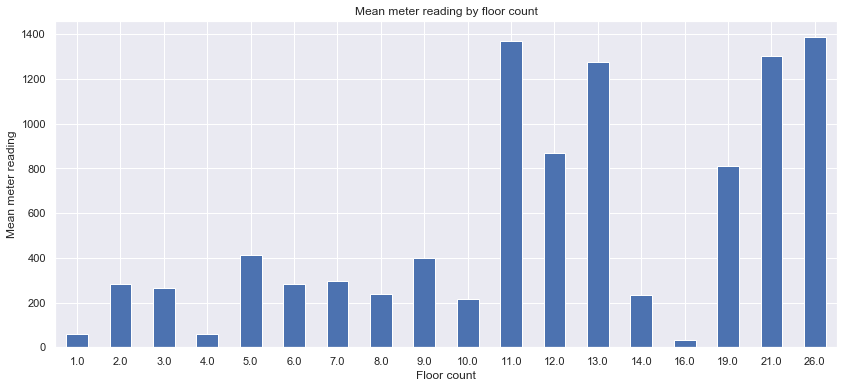

In [59]:
fig, axes = plt.subplots(1,1,figsize=(14, 6))
pd.Series(index=train['floor_count'].value_counts().index, 
          data=train.groupby('floor_count')['meter_reading'].transform('mean').value_counts().index).sort_index().plot(kind='bar', rot=0, ax=axes);
axes.set_xlabel('Floor count');
axes.set_ylabel('Mean meter reading');
axes.set_title('Mean meter reading by floor count');

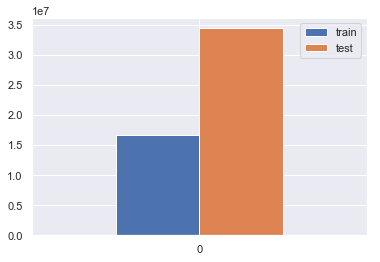

In [60]:
pd.DataFrame({'train': [train['floor_count'].isnull().sum()], 'test': [test['floor_count'].isnull().sum()]}).plot(kind='bar', rot=0);

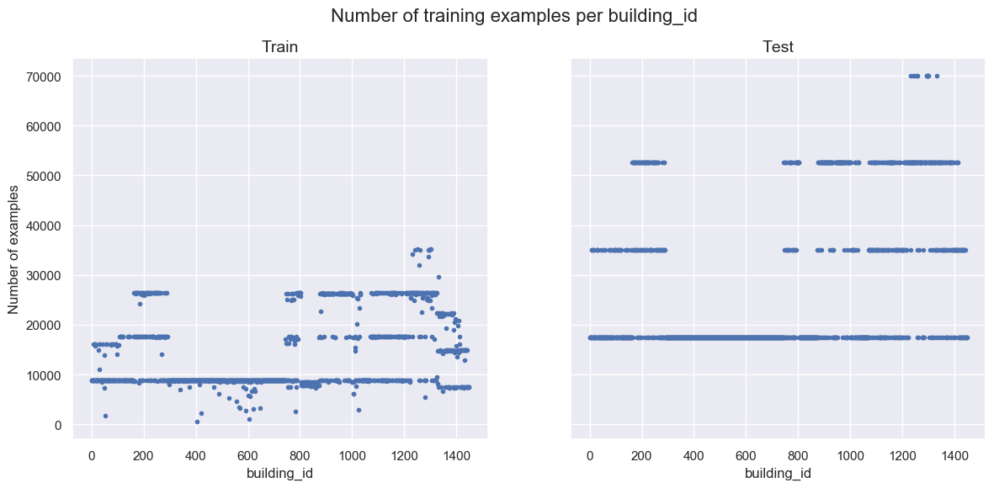

In [61]:
fig, axes = plt.subplots(1,2,figsize=(14, 6), sharey=True, dpi=100)
axes[0].plot(train['building_id'].value_counts().sort_index(), '.');
axes[1].plot(test['building_id'].value_counts().sort_index(), '.');
axes[0].set_title('Train', fontsize=14);
axes[1].set_title('Test', fontsize=14);
axes[0].set_xlabel('building_id');
axes[1].set_xlabel('building_id');
axes[0].set_ylabel('Number of examples');
fig.suptitle('Number of training examples per building_id', fontsize=16);

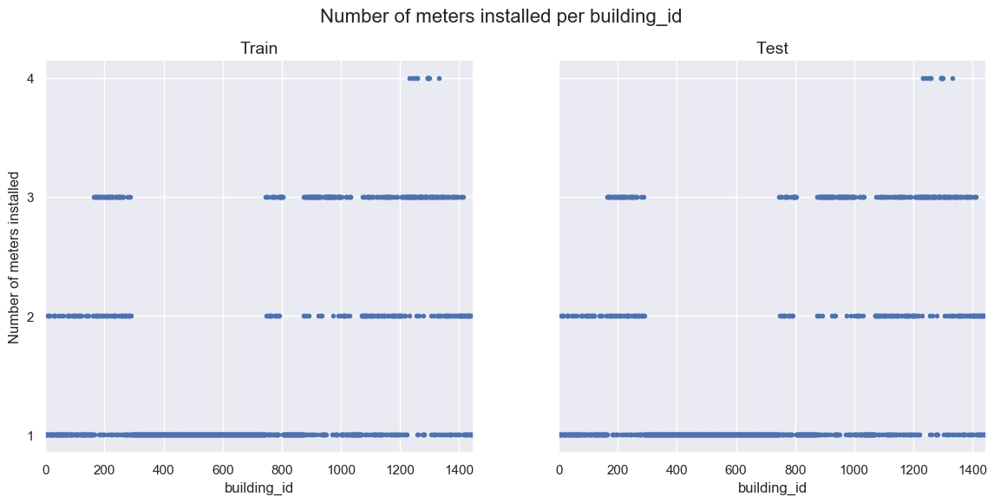

In [62]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=100, sharey=True)
train.groupby('building_id')['meter'].nunique().plot(style='.', ax=axes[0]);
test.groupby('building_id')['meter'].nunique().plot(style='.', ax=axes[1]);
axes[0].set_title('Train', fontsize=14);
axes[1].set_title('Test', fontsize=14);
axes[0].set_xlabel('building_id');
axes[1].set_xlabel('building_id');
axes[0].set_ylabel('Number of meters installed');
plt.yticks([1, 2, 3, 4]);
fig.suptitle('Number of meters installed per building_id', fontsize=16);

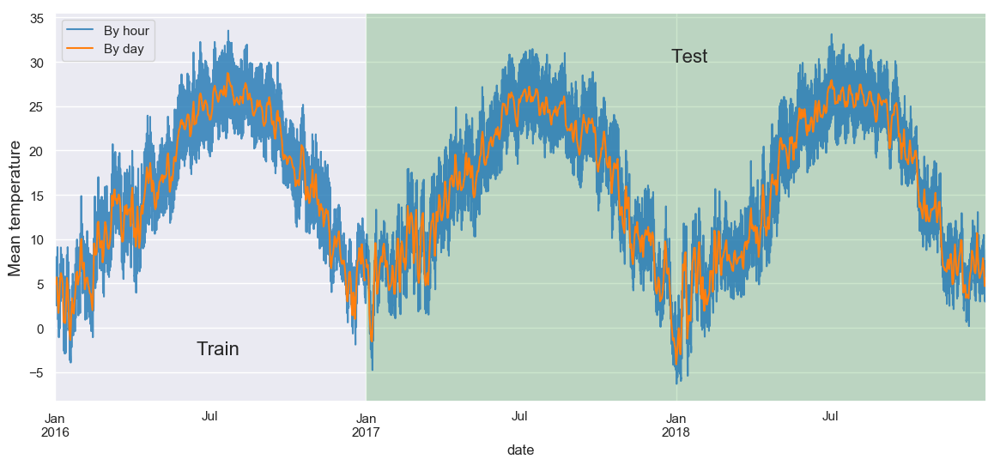

In [18]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
train[['date', 'air_temperature']].set_index('date').resample('H').mean()['air_temperature'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean temperature', fontsize=14);
test[['date', 'air_temperature']].set_index('date').resample('H').mean()['air_temperature'].plot(ax=axes, alpha=0.8, color='tab:blue', label='');
train[['date', 'air_temperature']].set_index('date').resample('D').mean()['air_temperature'].plot(ax=axes, alpha=1, label='By day', color='tab:orange');
test[['date', 'air_temperature']].set_index('date').resample('D').mean()['air_temperature'].plot(ax=axes, alpha=1, color='tab:orange', label='');
axes.legend();
axes.text(train['date'].iloc[9000000], -3, 'Train', fontsize=16);
axes.text(test['date'].iloc[29400000], 30, 'Test', fontsize=16);
axes.axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);

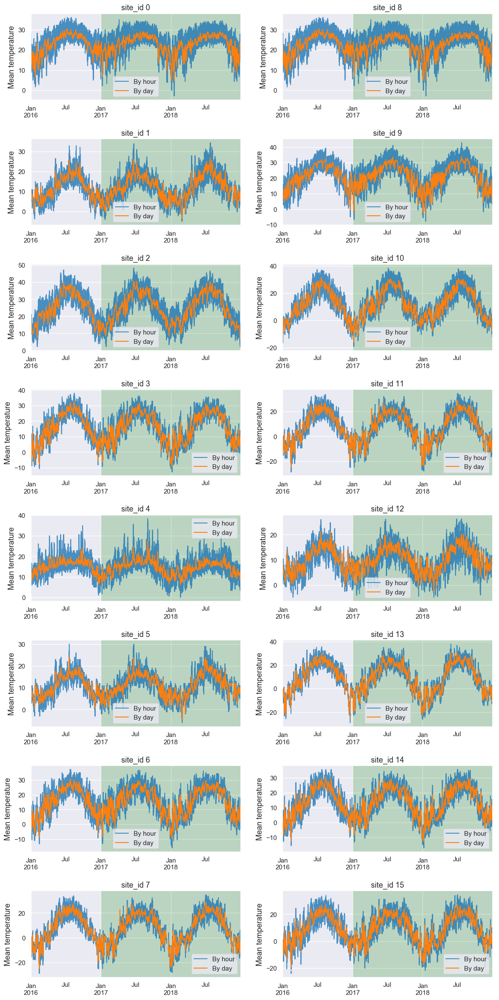

In [20]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    train[train['site_id'] == i][['date', 'air_temperature']].set_index('date').resample('H').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean temperature', fontsize=13);
    test[test['site_id'] == i][['date', 'air_temperature']].set_index('date').resample('H').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, color='tab:blue', label='').set_xlabel('')
    train[train['site_id'] == i][['date', 'air_temperature']].set_index('date').resample('D').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange')
    test[test['site_id'] == i][['date', 'air_temperature']].set_index('date').resample('D').mean()['air_temperature'].plot(ax=axes[i%8][i//8], alpha=1, color='tab:orange', label='').set_xlabel('')
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);
    axes[i%8][i//8].axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);
    plt.subplots_adjust(hspace=0.45)
plt.show()

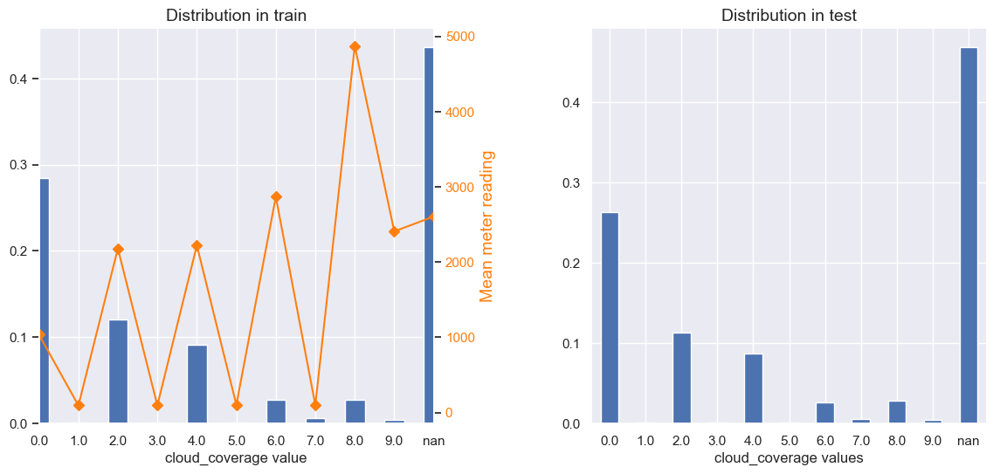

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=100)
train['cloud_coverage'].value_counts(dropna=False, normalize=True).sort_index().plot(kind='bar', rot=0, ax=axes[0]).set_xlabel('cloud_coverage value');
test['cloud_coverage'].value_counts(dropna=False, normalize=True).sort_index().plot(kind='bar', rot=0, ax=axes[1]).set_xlabel('cloud_coverage values');
axes[0].set_title('Distribution in train', fontsize=14);
axes[1].set_title('Distribution in test', fontsize=14);
ax2 = axes[0].twinx()
train[['cloud_coverage', 'meter_reading']].replace(np.nan, 'nan').groupby('cloud_coverage')['meter_reading'].mean().plot(ax=ax2, style='D-', grid=False, color='tab:orange');
ax2.tick_params(axis='y', labelcolor='tab:orange');
ax2.set_ylabel('Mean meter reading', color='tab:orange', fontsize=14);
ax2.set_xticklabels(train['cloud_coverage'].value_counts(dropna=False).sort_index().index)
plt.subplots_adjust(wspace=0.4);

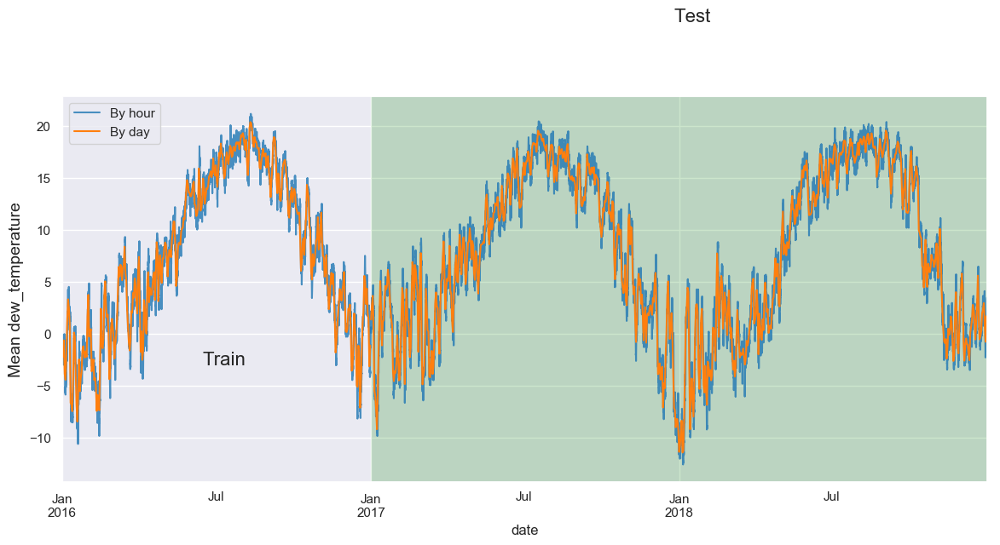

In [28]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
train[['date', 'dew_temperature']].set_index('date').resample('H').mean()['dew_temperature'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean dew_temperature', fontsize=14);
test[['date', 'dew_temperature']].set_index('date').resample('H').mean()['dew_temperature'].plot(ax=axes, alpha=0.8, color='tab:blue', label='');
train[['date', 'dew_temperature']].set_index('date').resample('D').mean()['dew_temperature'].plot(ax=axes, alpha=1, label='By day', color='tab:orange');
test[['date', 'dew_temperature']].set_index('date').resample('D').mean()['dew_temperature'].plot(ax=axes, alpha=1, color='tab:orange', label='');
axes.legend();
axes.text(train['date'].iloc[9000000], -3, 'Train', fontsize=16);
axes.text(test['date'].iloc[29400000], 30, 'Test', fontsize=16);
axes.axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);

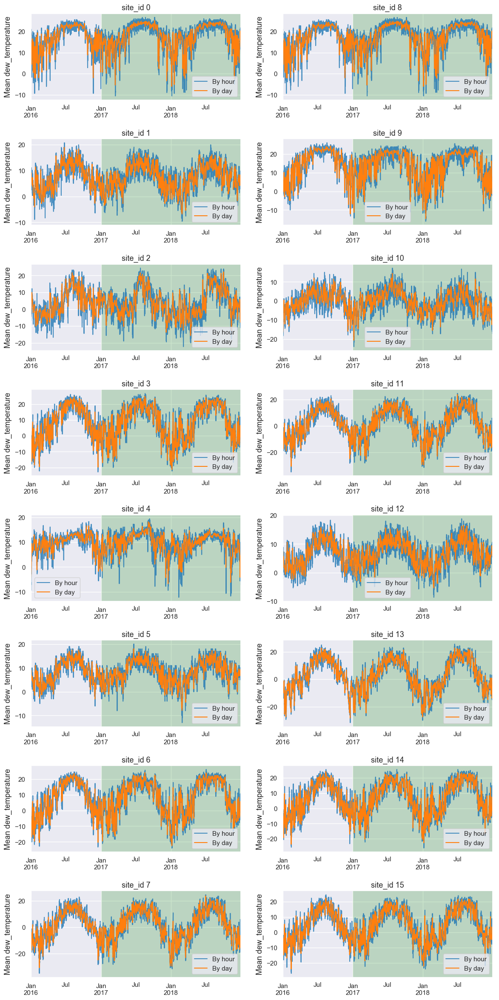

In [27]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    train[train['site_id'] == i][['date', 'dew_temperature']].set_index('date').resample('H').mean()['dew_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean dew_temperature', fontsize=13);
    test[test['site_id'] == i][['date', 'dew_temperature']].set_index('date').resample('H').mean()['dew_temperature'].plot(ax=axes[i%8][i//8], alpha=0.8, color='tab:blue', label='').set_xlabel('')
    train[train['site_id'] == i][['date', 'dew_temperature']].set_index('date').resample('D').mean()['dew_temperature'].plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange')
    test[test['site_id'] == i][['date', 'dew_temperature']].set_index('date').resample('D').mean()['dew_temperature'].plot(ax=axes[i%8][i//8], alpha=1, color='tab:orange', label='').set_xlabel('')
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);
    axes[i%8][i//8].axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);
    plt.subplots_adjust(hspace=0.45)
plt.show()

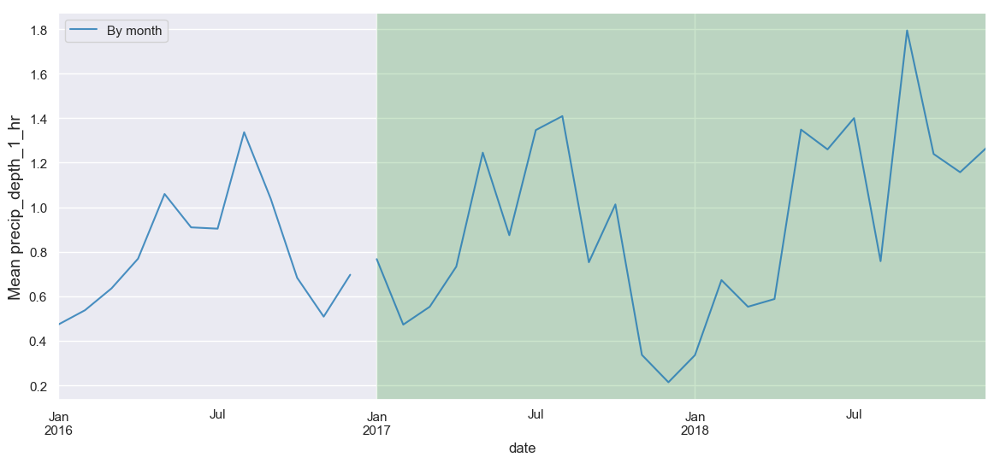

In [34]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
train[['date', 'precip_depth_1_hr']].set_index('date').resample('M').mean()['precip_depth_1_hr'].plot(ax=axes, alpha=0.8, label='By month', color='tab:blue').set_ylabel('Mean precip_depth_1_hr', fontsize=14);
test[['date', 'precip_depth_1_hr']].set_index('date').resample('M').mean()['precip_depth_1_hr'].plot(ax=axes, alpha=0.8, color='tab:blue', label='');
axes.legend();
axes.axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);

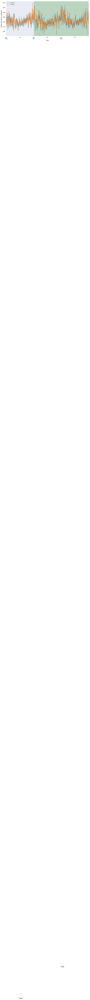

In [35]:
fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
train[['date', 'sea_level_pressure']].set_index('date').resample('H').mean()['sea_level_pressure'].plot(ax=axes, alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean sea_level_pressure', fontsize=14);
test[['date', 'sea_level_pressure']].set_index('date').resample('H').mean()['sea_level_pressure'].plot(ax=axes, alpha=0.8, color='tab:blue', label='');
train[['date', 'sea_level_pressure']].set_index('date').resample('D').mean()['sea_level_pressure'].plot(ax=axes, alpha=1, label='By day', color='tab:orange');
test[['date', 'sea_level_pressure']].set_index('date').resample('D').mean()['sea_level_pressure'].plot(ax=axes, alpha=1, color='tab:orange', label='');
axes.legend();
axes.text(train['date'].iloc[9000000], -3, 'Train', fontsize=16);
axes.text(test['date'].iloc[29400000], 30, 'Test', fontsize=16);
axes.axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);

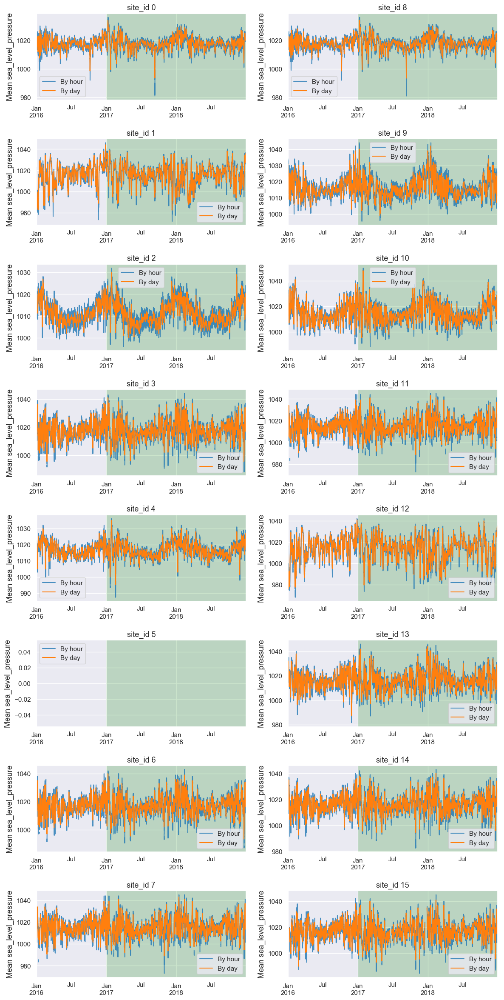

In [36]:
fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)
for i in range(train['site_id'].nunique()):
    train[train['site_id'] == i][['date', 'sea_level_pressure']].set_index('date').resample('H').mean()['sea_level_pressure'].plot(ax=axes[i%8][i//8], alpha=0.8, label='By hour', color='tab:blue').set_ylabel('Mean sea_level_pressure', fontsize=13);
    test[test['site_id'] == i][['date', 'sea_level_pressure']].set_index('date').resample('H').mean()['sea_level_pressure'].plot(ax=axes[i%8][i//8], alpha=0.8, color='tab:blue', label='').set_xlabel('')
    train[train['site_id'] == i][['date', 'sea_level_pressure']].set_index('date').resample('D').mean()['sea_level_pressure'].plot(ax=axes[i%8][i//8], alpha=1, label='By day', color='tab:orange')
    test[test['site_id'] == i][['date', 'sea_level_pressure']].set_index('date').resample('D').mean()['sea_level_pressure'].plot(ax=axes[i%8][i//8], alpha=1, color='tab:orange', label='').set_xlabel('')
    axes[i%8][i//8].legend();
    axes[i%8][i//8].set_title('site_id {}'.format(i), fontsize=13);
    axes[i%8][i//8].axvspan(test['date'].min(), test['date'].max(), facecolor='green', alpha=0.2);
    plt.subplots_adjust(hspace=0.45)
plt.show()

In [39]:
train[train['site_id'] == 5]['sea_level_pressure'].value_counts(dropna=False)

NaN    781776
Name: sea_level_pressure, dtype: int64

In [40]:
print('Number of observations with 0 degree direction in TRAIN: {} ({:.2f}%)'.format(train[train['wind_direction'] == 0].shape[0], train[train['wind_direction'] == 0].shape[0] / len(train)))
print('Number of observations with 0 degree direction in TEST: {} ({:.2f}%)'.format(test[test['wind_direction'] == 0].shape[0], test[test['wind_direction'] == 0].shape[0] / len(test)))
print('Number of observations with 360 degree direction in TRAIN: {} ({:.2f}%)'.format(train[train['wind_direction'] == 360].shape[0], train[train['wind_direction'] == 360].shape[0] / len(train)))
print('Number of observations with 360 degree direction in TEST: {} ({:.2f}%)'.format(test[test['wind_direction'] == 360].shape[0], test[test['wind_direction'] == 360].shape[0] / len(test)))

Number of observations with 0 degree direction in TRAIN: 2373540 (0.12%)
Number of observations with 0 degree direction in TEST: 4796510 (0.12%)
Number of observations with 360 degree direction in TRAIN: 421533 (0.02%)
Number of observations with 360 degree direction in TEST: 813553 (0.02%)


In [41]:
print('Number of observations that have calm conditions in TRAIN: {} ({:.2f}%)'.format(train[train['wind_speed'] == 0].shape[0], train[train['wind_speed'] == 0].shape[0] / len(train)))
print('Number of observations that have calm conditions in TEST: {} ({:.2f}%)'.format(test[test['wind_speed'] == 0].shape[0], test[test['wind_speed'] == 0].shape[0] / len(test)))

Number of observations that have calm conditions in TRAIN: 2384761 (0.12%)
Number of observations that have calm conditions in TEST: 4822497 (0.12%)


In [43]:
def speed_labels(bins:list, units:str) -> list:   
    labels = list()
    for left, right in zip(bins[:-1], bins[1:]):
        if left == bins[0]:
            labels.append('calm'.format(right))
        elif np.isinf(right):
            labels.append('>{} {}'.format(left, units))
        else:
            labels.append('{} - {} {}'.format(left, right, units))
    return labels

def _convert_dir(directions, N=None):
    if N is None:
        N = directions.shape[0]
    barDir = directions * np.pi/180. - np.pi/N
    barWidth = 2 * np.pi / N
    return barDir, barWidth

spd_bins = [-1, 0, 5, 10, 15, 20, 25, 30, np.inf]
spd_labels = speed_labels(spd_bins, units='m/s')

dir_bins = np.arange(-7.5, 370, 15)
dir_labels = (dir_bins[:-1] + dir_bins[1:]) / 2

calm_count = train[train['wind_speed'] == 0].shape[0]
total_count = len(train)
rose = (train.assign(WindSpd_bins=lambda df:
            pd.cut(df['wind_speed'], bins=spd_bins, labels=spd_labels, right=True)).assign(WindDir_bins=lambda df: pd.cut(df['wind_direction'], bins=dir_bins, labels=dir_labels, right=False)).replace({'WindDir_bins': {360: 0}}).groupby(by=['WindSpd_bins', 'WindDir_bins']).size().unstack(level='WindSpd_bins').fillna(0).assign(calm=lambda df: calm_count / df.shape[0]).sort_index(axis=1).applymap(lambda x: x / total_count * 100))
rose.drop(rose.index[0], inplace=True)
directions = np.arange(0, 360, 15)

In [50]:
def wind_rose(rosedata, wind_dirs, title='', palette=None):
    if palette is None:
        palette = sns.color_palette('inferno', n_colors=rosedata.shape[1])

    bar_dir, bar_width = _convert_dir(wind_dirs)

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
    ax.set_theta_direction('clockwise')
    ax.set_theta_zero_location('N')

    for n, (c1, c2) in enumerate(zip(rosedata.columns[:-1], rosedata.columns[1:])):
        if n == 0:
            # first column only
            ax.bar(bar_dir, rosedata[c1].values, 
                   width=bar_width,
                   color=palette[0],
                   edgecolor='none',
                   label=c1,
                   linewidth=0)

        # all other columns
        ax.bar(bar_dir, rosedata[c2].values, 
               width=bar_width, 
               bottom=rosedata.cumsum(axis=1)[c1].values,
               color=palette[n+1],
               edgecolor='none',
               label=c2,
               linewidth=0)

    leg = ax.legend(loc=(0.75, 0.95), ncol=2)
    xtl = ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'])
    ax.set_title(title, fontsize=14);
    
    return fig

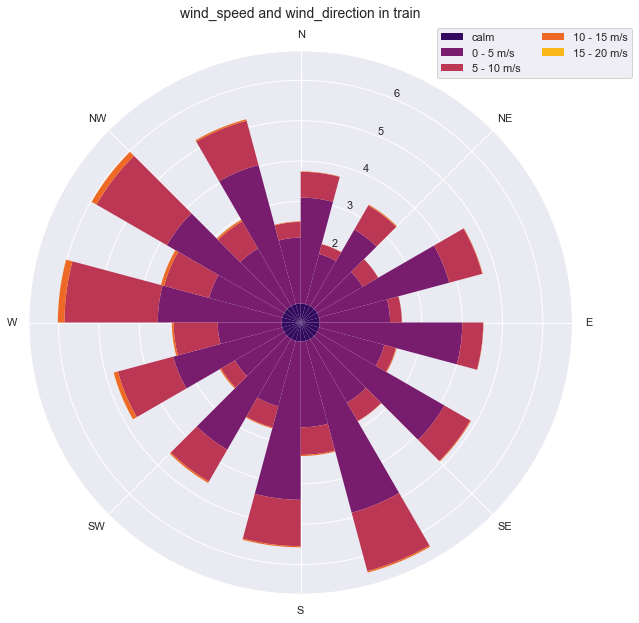

In [51]:
fig = wind_rose(rose, directions, 'wind_speed and wind_direction in train')

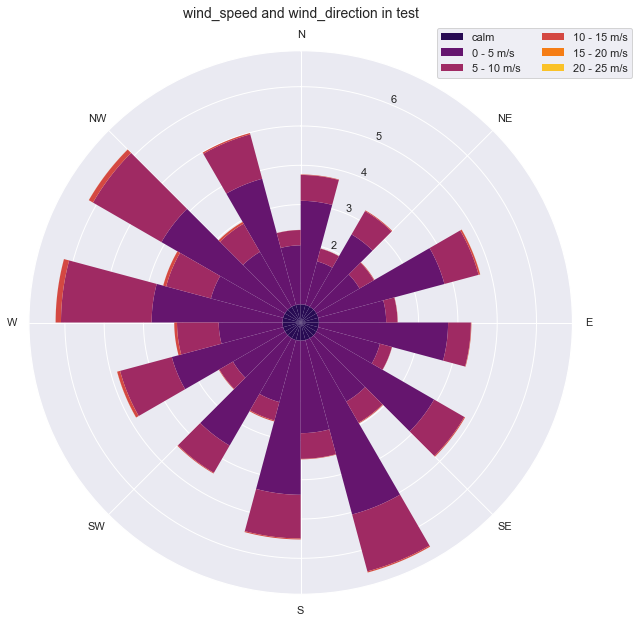

In [52]:
calm_count = test[test['wind_speed'] == 0].shape[0]
total_count = len(test)
rose = (test.assign(WindSpd_bins=lambda df:
            pd.cut(df['wind_speed'], bins=spd_bins, labels=spd_labels, right=True)).assign(WindDir_bins=lambda df: pd.cut(df['wind_direction'], bins=dir_bins, labels=dir_labels, right=False)).replace({'WindDir_bins': {360: 0}}).groupby(by=['WindSpd_bins', 'WindDir_bins']).size().unstack(level='WindSpd_bins').fillna(0).assign(calm=lambda df: calm_count / df.shape[0]).sort_index(axis=1).applymap(lambda x: x / total_count * 100))
rose.drop(rose.index[0], inplace=True)

fig = wind_rose(rose, directions, 'wind_speed and wind_direction in test')

## Engineered features

### hour

In [54]:
train['hour'] = train['date'].dt.hour
test['hour'] = test['date'].dt.hour

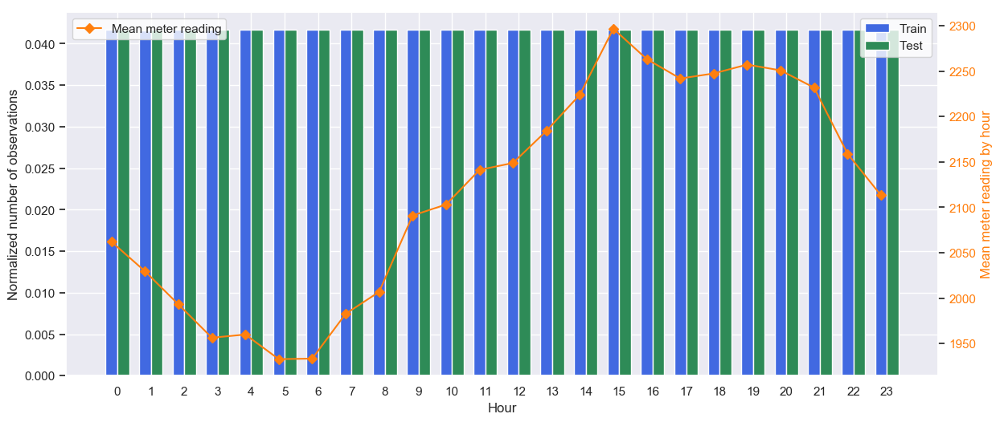

In [55]:
train_data = train['hour'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['hour'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('Hour');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels(train['hour'].value_counts().sort_index().index, rotation=0)
axes2 = axes.twinx()
mr = axes2.plot(ind, train[['hour', 'meter_reading']].groupby('hour')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
axes2.grid(False);
axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white');
axes2.legend(loc=2, facecolor='white');

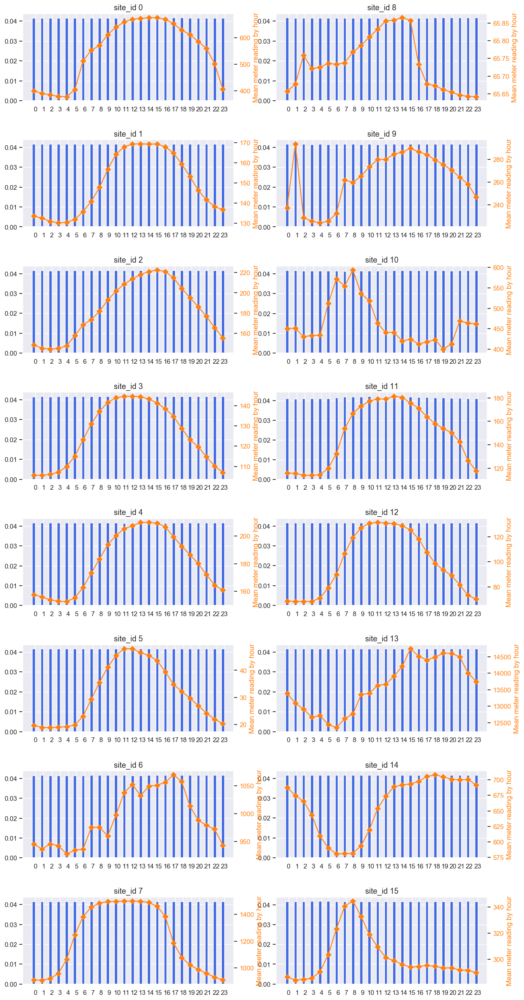

In [71]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)

for i, s_id in enumerate(train['site_id'].unique()):
    tmp = train[train.site_id==s_id]
    
    train_data = tmp['hour'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i%8][i//8].bar(ind, train_data, width, color='royalblue')
    axes[i%8][i//8].set_xticks(ind + width / 2)
    axes[i%8][i//8].set_xticklabels(tmp['hour'].value_counts().sort_index().index, rotation=0)
    axes[i%8][i//8].set_title('site_id {}'.format(s_id), fontsize=13);
    axes2 = axes[i%8][i//8].twinx()
    mr = axes2.plot(ind, tmp[['hour', 'meter_reading']].groupby('hour')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

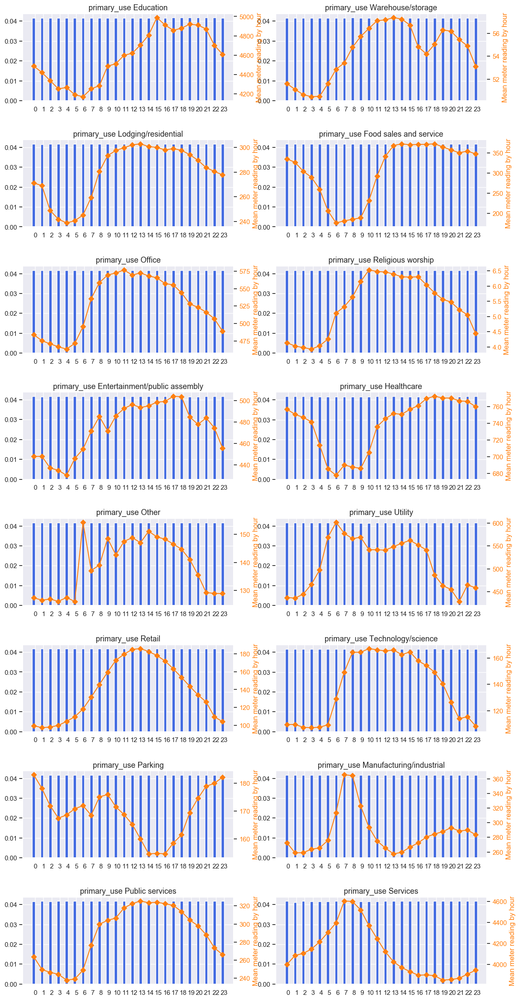

In [72]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)

for i, primary_use in enumerate(train['primary_use'].unique()):
    tmp = train[train.primary_use==primary_use]
    
    train_data = tmp['hour'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i%8][i//8].bar(ind, train_data, width, color='royalblue')
    axes[i%8][i//8].set_xticks(ind + width / 2)
    axes[i%8][i//8].set_xticklabels(tmp['hour'].value_counts().sort_index().index, rotation=0)
    axes[i%8][i//8].set_title('primary_use {}'.format(primary_use), fontsize=13);
    axes2 = axes[i%8][i//8].twinx()
    mr = axes2.plot(ind, tmp[['hour', 'meter_reading']].groupby('hour')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

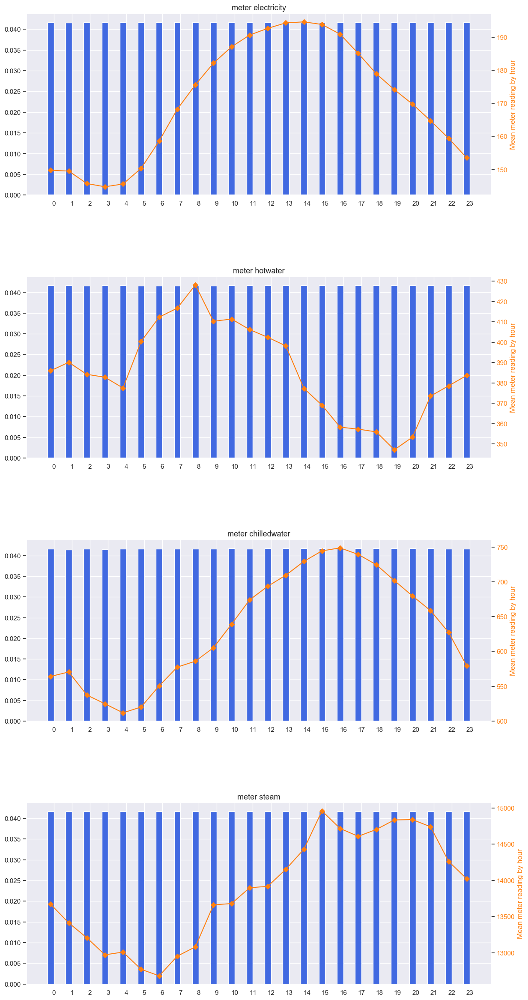

In [74]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(4,1,figsize=(14, 30), dpi=100)

for i, meter in enumerate(train['meter'].unique()):
    tmp = train[train.meter==meter]
    
    train_data = tmp['hour'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i].bar(ind, train_data, width, color='royalblue')
    axes[i].set_xticks(ind + width / 2)
    axes[i].set_xticklabels(tmp['hour'].value_counts().sort_index().index, rotation=0)
    axes[i].set_title('meter {}'.format(meter_dic[meter]), fontsize=13);
    axes2 = axes[i].twinx()
    mr = axes2.plot(ind, tmp[['hour', 'meter_reading']].groupby('hour')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

### day

In [56]:
train['day'] = train['date'].dt.day
test['day'] = test['date'].dt.day

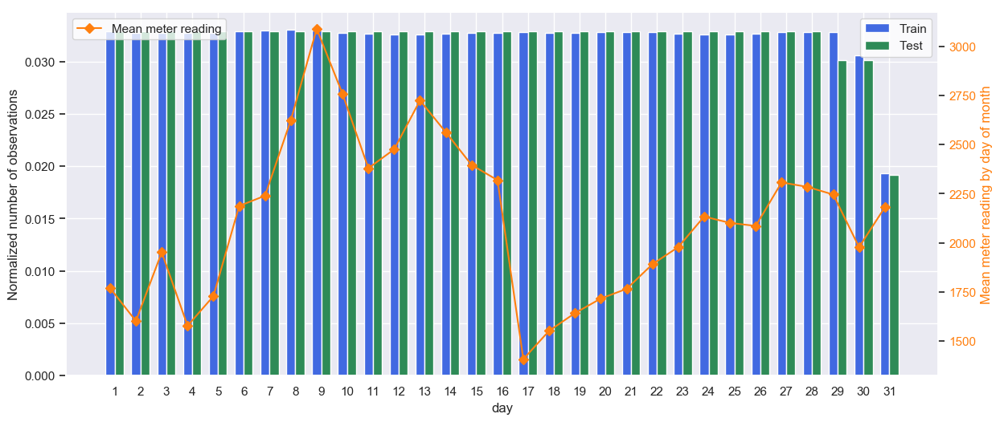

In [57]:
train_data = train['day'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['day'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('day');
axes.set_xticks(ind + width / 2)
axes.set_xticklabels(train['day'].value_counts().sort_index().index, rotation=0)
axes2 = axes.twinx()
mr = axes2.plot(ind, train[['day', 'meter_reading']].groupby('day')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
axes2.grid(False);
axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by day of month', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white');
axes2.legend(loc=2, facecolor='white');

### weekday

In [59]:
train['weekday'] = train['date'].dt.weekday
test['weekday'] = test['date'].dt.weekday

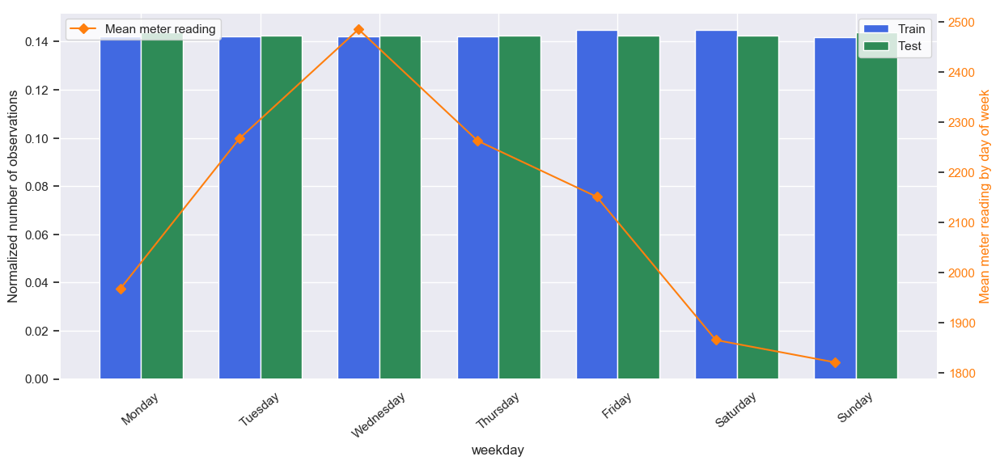

In [60]:
train_data = train['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
tr = axes.bar(ind, train_data, width, color='royalblue')

test_data = test['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
tt = axes.bar(ind+width, test_data, width, color='seagreen')

axes.set_ylabel('Normalized number of observations');
axes.set_xlabel('weekday');
axes.set_xticks(ind + width / 2)
axes2 = axes.twinx()
mr = axes2.plot(ind, train[['weekday', 'meter_reading']].groupby('weekday')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
axes2.grid(False);
axes2.tick_params(axis='y', labelcolor='tab:orange');
axes2.set_ylabel('Mean meter reading by day of week', color='tab:orange');
axes.legend([tr, tt], ['Train', 'Test'], facecolor='white');
axes2.legend(loc=2, facecolor='white');

axes.set_xticklabels(train['weekday'].value_counts().sort_index().index.map({0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}), rotation=40);

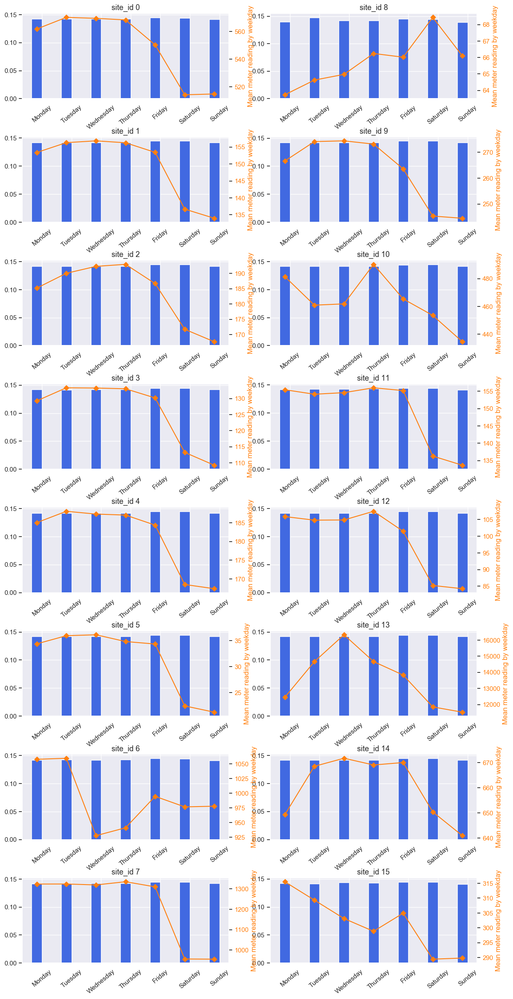

In [77]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)

for i, s_id in enumerate(train['site_id'].unique()):
    tmp = train[train.site_id==s_id]
    
    train_data = tmp['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i%8][i//8].bar(ind, train_data, width, color='royalblue')
    axes[i%8][i//8].set_xticks(ind + width / 2)
    axes[i%8][i//8].set_xticklabels(tmp['weekday'].value_counts().sort_index().index, rotation=0)
    axes[i%8][i//8].set_title('site_id {}'.format(s_id), fontsize=13);
    axes[i%8][i//8].set_xticklabels(train['weekday'].value_counts().sort_index().index.map({0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}), rotation=40);
    axes2 = axes[i%8][i//8].twinx()
    mr = axes2.plot(ind, tmp[['weekday', 'meter_reading']].groupby('weekday')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by weekday', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

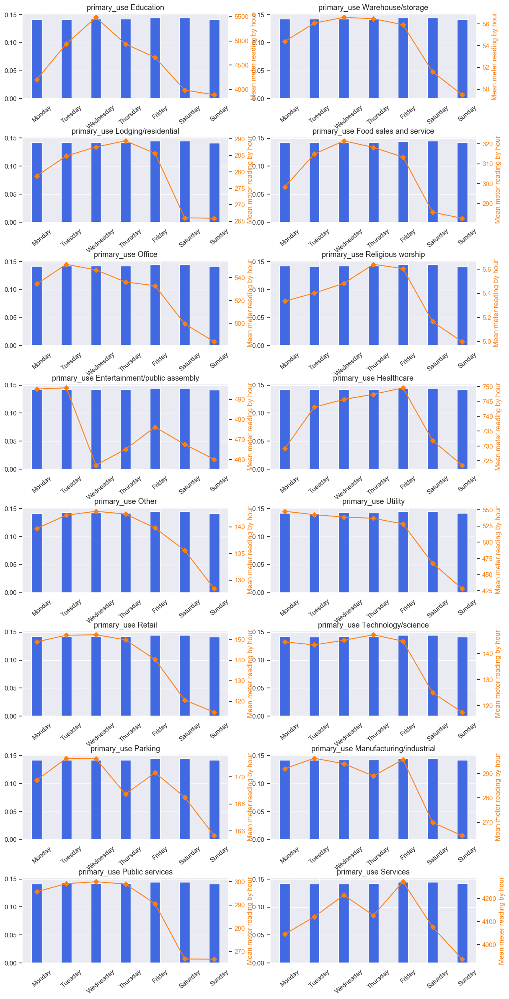

In [78]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(8,2,figsize=(14, 30), dpi=100)

for i, primary_use in enumerate(train['primary_use'].unique()):
    tmp = train[train.primary_use==primary_use]
    
    train_data = tmp['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i%8][i//8].bar(ind, train_data, width, color='royalblue')
    axes[i%8][i//8].set_xticks(ind + width / 2)
    axes[i%8][i//8].set_xticklabels(tmp['weekday'].value_counts().sort_index().index, rotation=0)
    axes[i%8][i//8].set_title('primary_use {}'.format(primary_use), fontsize=13);
    axes[i%8][i//8].set_xticklabels(train['weekday'].value_counts().sort_index().index.map({0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}), rotation=40);
    axes2 = axes[i%8][i//8].twinx()
    mr = axes2.plot(ind, tmp[['weekday', 'meter_reading']].groupby('weekday')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

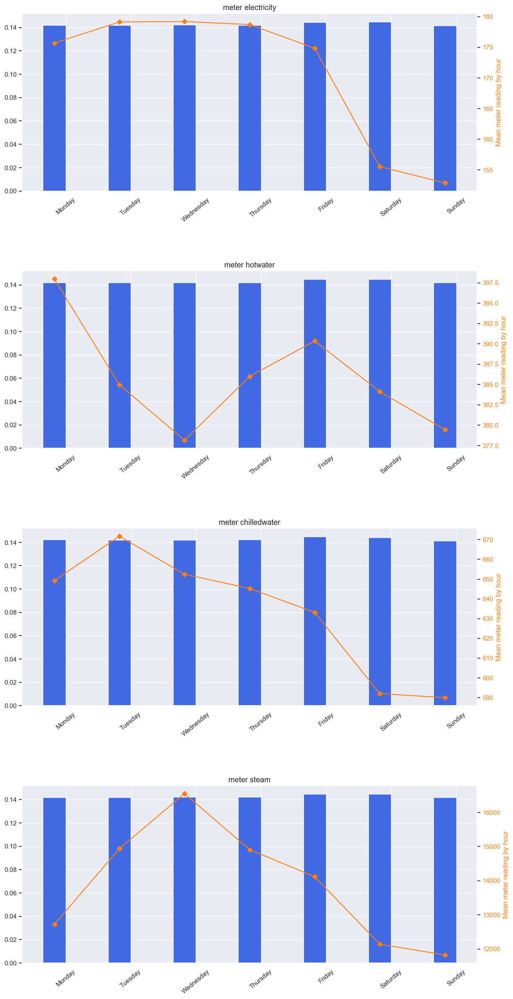

In [79]:
ind = np.arange(len(train_data))
width = 0.35

fig, axes = plt.subplots(4,1,figsize=(14, 30), dpi=100)

for i, meter in enumerate(train['meter'].unique()):
    tmp = train[train.meter==meter]
    
    train_data = tmp['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes[i].bar(ind, train_data, width, color='royalblue')
    axes[i].set_xticks(ind + width / 2)
    axes[i].set_xticklabels(tmp['weekday'].value_counts().sort_index().index, rotation=0)
    axes[i].set_title('meter {}'.format(meter_dic[meter]), fontsize=13);
    axes[i].set_xticklabels(train['weekday'].value_counts().sort_index().index.map({0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}), rotation=40);
    axes2 = axes[i].twinx()
    mr = axes2.plot(ind, tmp[['weekday', 'meter_reading']].groupby('weekday')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.subplots_adjust(hspace=0.45)
plt.show()

In [80]:
train[train.site_id==8]['building_id'].unique()

array([804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816,
       817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 830,
       831, 832, 833, 834, 835, 836, 837, 838, 840, 841, 842, 843, 844,
       845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857,
       858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870,
       871, 872, 873, 829, 839])

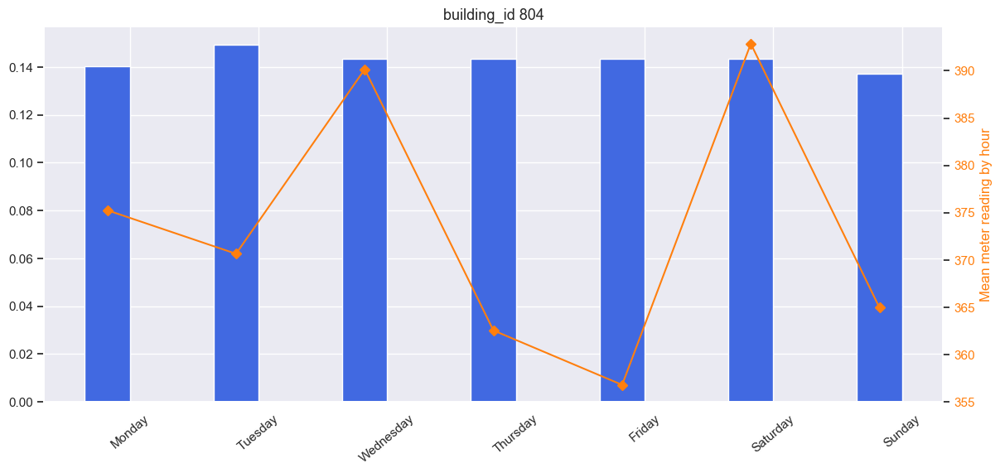

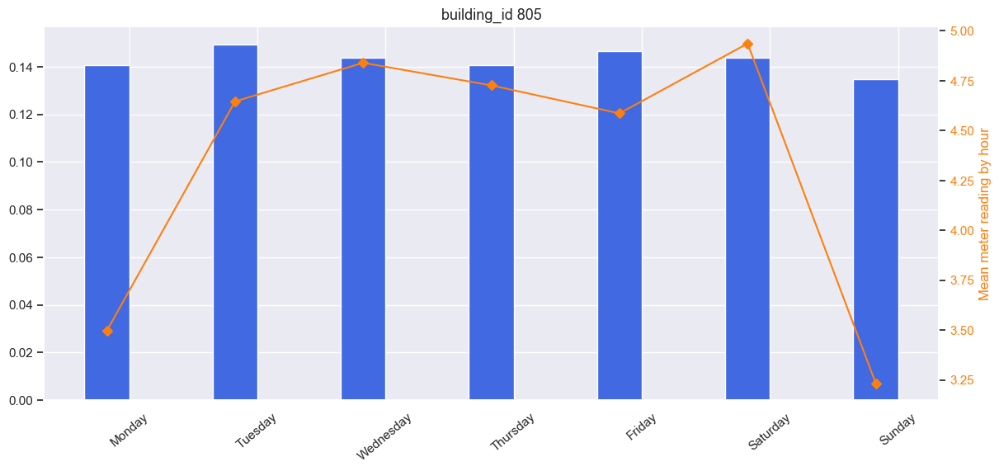

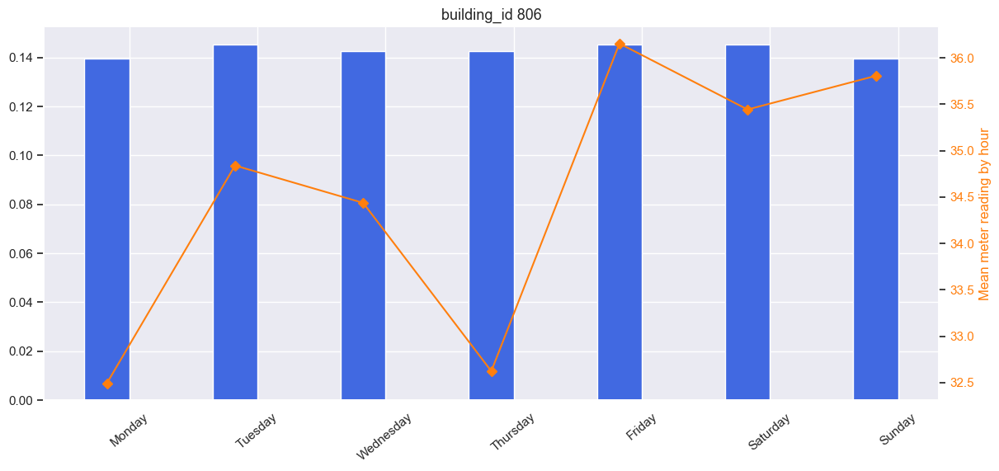

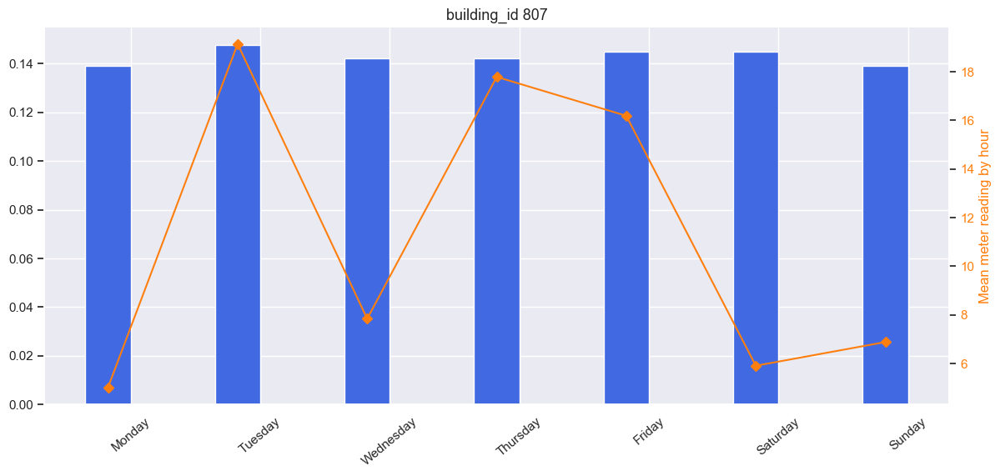

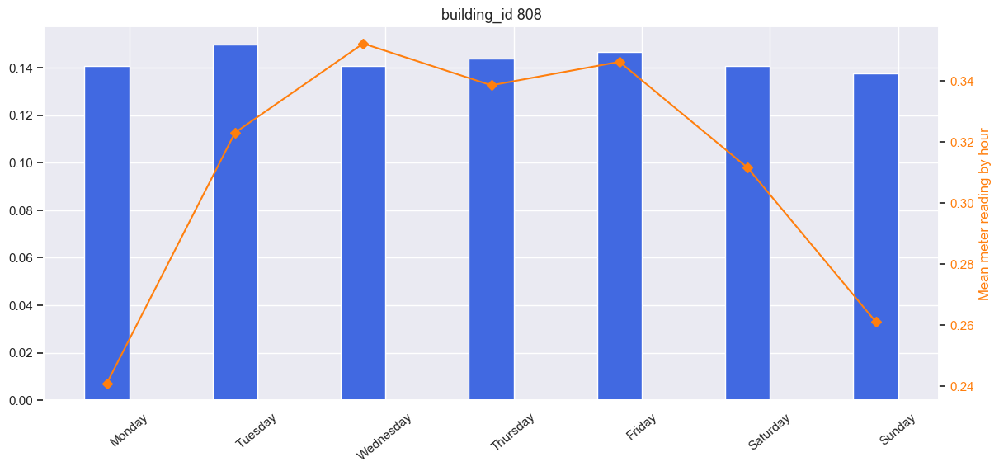

...

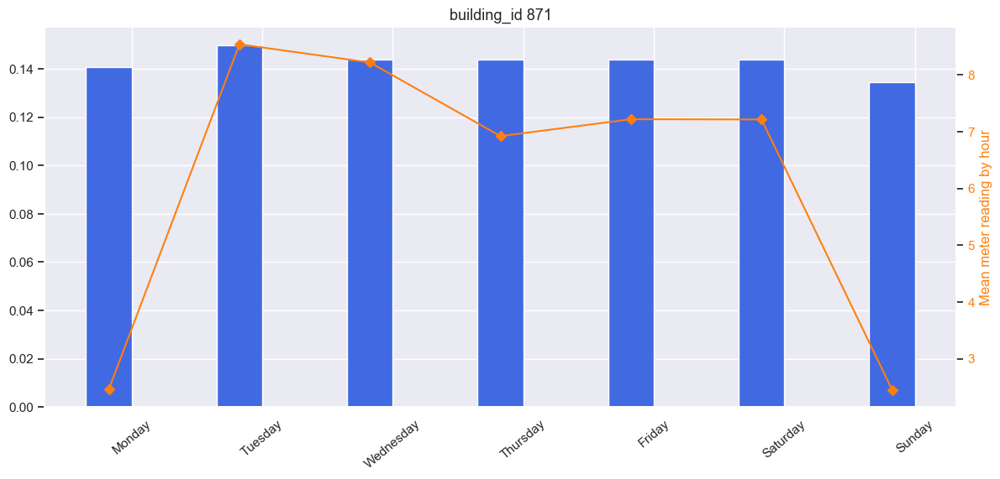

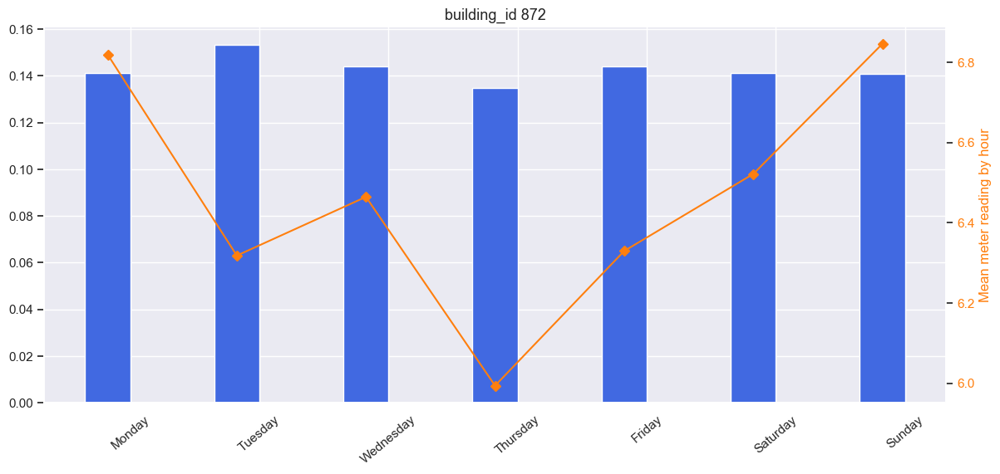

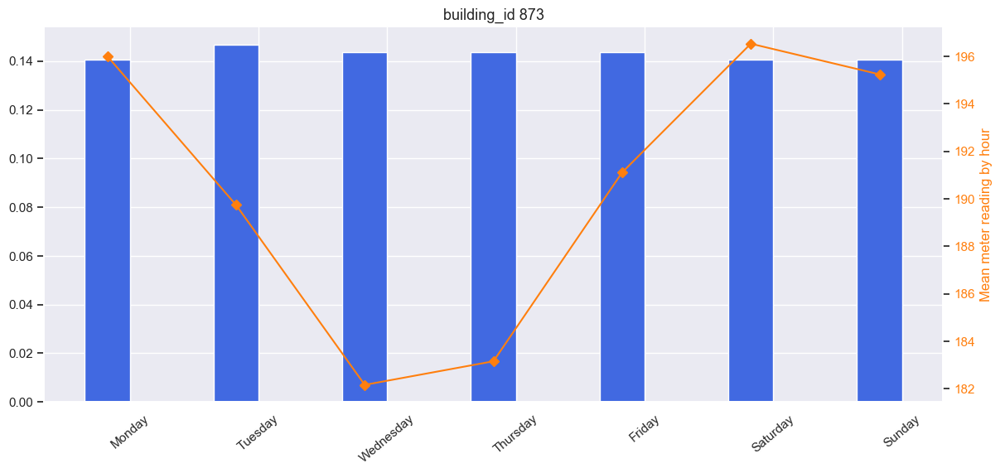

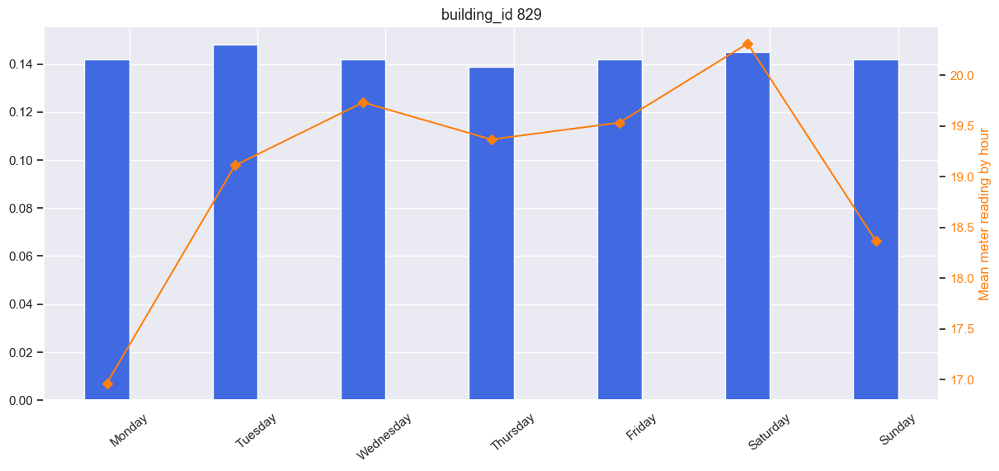

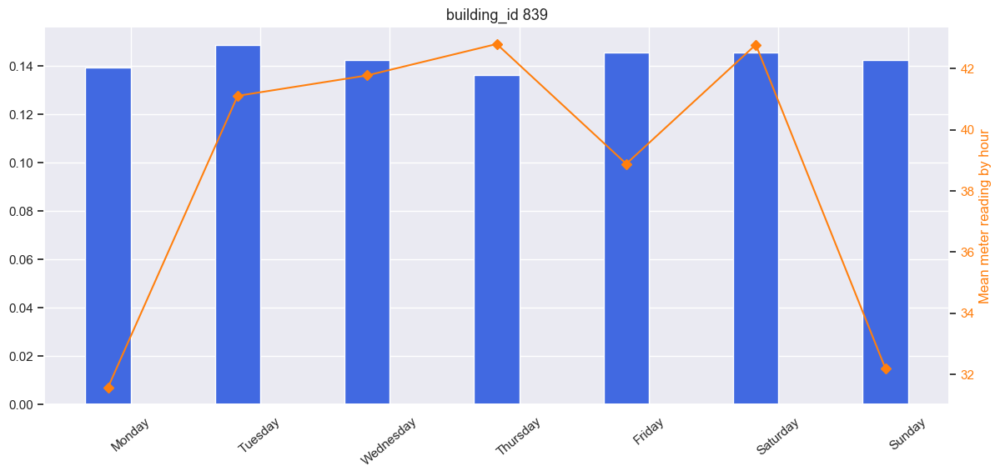

In [82]:
ind = np.arange(len(train_data))
width = 0.35
for i in train[train.site_id==8]['building_id'].unique():
    fig, axes = plt.subplots(1,1,figsize=(14, 6), dpi=100)
    tmp = train[train.building_id==i]
    train_data = tmp['weekday'].value_counts(dropna=False, normalize=True).sort_index().values
    tr = axes.bar(ind, train_data, width, color='royalblue')
    axes.set_xticks(ind + width / 2)
    axes.set_xticklabels(tmp['weekday'].value_counts().sort_index().index, rotation=0)
    axes.set_title('building_id {}'.format(i), fontsize=13);
    axes.set_xticklabels(train['weekday'].value_counts().sort_index().index.map({0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}), rotation=40);
    axes2 = axes.twinx()
    mr = axes2.plot(ind, tmp[['weekday', 'meter_reading']].groupby('weekday')['meter_reading'].mean().sort_index().values, 'D-', color='tab:orange', label='Mean meter reading');
    axes2.grid(False);
    axes2.tick_params(axis='y', labelcolor='tab:orange');
    axes2.set_ylabel('Mean meter reading by hour', color='tab:orange');
    plt.show()
